# Optymalizacja i testowanie sieci neuronowych do odszumiania różnych funkcji
## Punkt 1: Konfiguracja środowiska i testy wydajności GPU

W tej sekcji sprawdzimy dostępność GPU, zainstalujemy niezbędne biblioteki zoptymalizowane pod CUDA, a następnie przeprowadzimy test porównawczy CPU vs GPU przy użyciu Pytorch.

In [2]:
# Sprawdzenie dostępności GPU i instalacja bibliotek (jeśli to konieczne)
import subprocess
import sys



try:
    import torch
    print(f"CUDA dostępne: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"Używana karta graficzna: {torch.cuda.get_device_name(0)}")
except ImportError:
    print("Instalacja Pytorch i pokrewnych bibliotek")
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'torch', 'torchvision', 'torchaudio'])
    import torch
    print(f"CUDA dostępne po instalacji: {torch.cuda.is_available()}")

# Instalacja pozostałych bibliotek
for pkg in ['numpy', 'pandas', 'matplotlib']:
    try:
        __import__(pkg)
    except ImportError:
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', pkg])

CUDA dostępne: True
Używana karta graficzna: NVIDIA GeForce RTX 2050


In [3]:
# Test porównawczy CPU vs GPU czasu wykonania mnożenia dużych macierzy na CPU i GPU przy użyciu biblioteki PyTorch.
import torch
import time

size = 10000

# CPU test
a_cpu = torch.randn(size, size)
b_cpu = torch.randn(size, size)
start_cpu = time.time()
c_cpu = torch.matmul(a_cpu, b_cpu)
end_cpu = time.time()
cpu_time = end_cpu - start_cpu

# GPU test
if torch.cuda.is_available():
    a_gpu = a_cpu.to('cuda')
    b_gpu = b_cpu.to('cuda')
    torch.cuda.synchronize()
    start_gpu = time.time()
    c_gpu = torch.matmul(a_gpu, b_gpu)
    torch.cuda.synchronize()
    end_gpu = time.time()
    gpu_time = end_gpu - start_gpu
    print(f"Czas obliczeń na CPU: {cpu_time:.4f} s")
    print(f"Czas obliczeń na GPU: {gpu_time:.4f} s")
else:
    print("GPU niedostępne. Czas obliczeń na CPU: {:.4f} s".format(cpu_time))

Czas obliczeń na CPU: 5.3733 s
Czas obliczeń na GPU: 0.5535 s


## Punkt 2: Testowanie różnych rozwiązań dla 1k, 5k, 10k epok

W tej sekcji:
- Wygenerujemy dane z szumem dla różnych funkcji matematycznych.
- Zbudujemy elastyczny model MLP do odszumiania danych.
- Przeprowadzimy eksperymenty dla różnych liczby epok.
- Zbierzemy i przedstawimy wyniki w formie tabelarycznej oraz graficznej.


**DDPM (Denoising Diffusion Probabilistic Model)**
To oryginalna wersja opisana przez Ho et al. (2020).
Proces reverse jest stochastyczny – na każdym kroku dodajemy trochę losowego szumu.
Dzięki temu generowane dane są bardziej zróżnicowane (np. różne warianty tego samego obrazu).
Ale: sampling trwa dłużej (1000 kroków) i nie zawsze jest deterministyczny.

**DDIM (Denoising Diffusion Implicit Model)**
Zaproponowane później przez Song et al. (2020).
Reverse process jest deterministyczny – nie dodajemy losowego szumu $z$.
Można stosować mniej kroków (np. tylko 50, 100 zamiast 1000), a mimo to generacja pozostaje jakościowa.
Jest szybszy i bardziej kontrolowany (np. dobre do interpolacji).

In [4]:
# Importy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Używane urządzenie: {device}")


Używane urządzenie: cuda


In [33]:
def generate_ddpm_training_batch(func_name, T, num_samples=100):
    x = np.linspace(-2.5, 2.5, num_samples)
    
    if func_name == 'sin':
        y = np.sin(x)
    elif func_name == 'exp':
        y = np.exp(x)
    elif func_name == 'tanh':
        y = np.tanh(x)
    else:
        raise ValueError("Nieznana funkcja.")
    
    beta_start = 0.0001
    beta_end = 0.002
    betas = np.linspace(beta_start, beta_end, T)
    alphas = 1 - betas
    alpha_bars = np.cumprod(alphas)

    t = np.random.randint(1, T, size=(num_samples,))
    epsilon = np.random.randn(num_samples)

    sqrt_alpha_bar = np.sqrt(alpha_bars[t])
    sqrt_one_minus_alpha_bar = np.sqrt(1 - alpha_bars[t])
    
    x_t = sqrt_alpha_bar * y + sqrt_one_minus_alpha_bar * epsilon
    
    return x_t, t, epsilon, y, x


In [34]:
# Prosty elastyczny model MLP
class DenoisingMLP(nn.Module):
    def __init__(self, input_dim=1, hidden_layers=[64, 64], output_dim=1):
        super(DenoisingMLP, self).__init__()
        layers = []
        prev_dim = input_dim
        for h in hidden_layers:
            layers.append(nn.Linear(prev_dim, h))
            layers.append(nn.ReLU())
            prev_dim = h
        layers.append(nn.Linear(prev_dim, output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


In [35]:
def train_ddpm_model(x_t, t, epsilon, epochs=1000, hidden_layers=[64, 64]):
    model = DenoisingMLP(input_dim=2, hidden_layers=hidden_layers, output_dim=1).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.MSELoss()

    x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
    t_tensor = torch.tensor(t, dtype=torch.float32).unsqueeze(1).to(device) / T
    eps_tensor = torch.tensor(epsilon, dtype=torch.float32).unsqueeze(1).to(device)

    inputs = torch.cat([x_t_tensor, t_tensor], dim=1)
    dataset = torch.utils.data.TensorDataset(inputs, eps_tensor)
    loader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)

    history = []
    start = time.time()
    for epoch in range(epochs):
        model.train()
        for xb, yb in loader:
            pred = model(xb)
            loss = criterion(pred, yb)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        history.append(loss.item())
    duration = time.time() - start
    return model, history, duration


In [47]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

T = 100  
epochs_schedule = [10, 100, 250, 500, 750, 1000, 1500, 2000, 3000, 5000, 7000, 10000]
functions = ['sin', 'tanh','exp']
results = []

betas = np.linspace(0.0001, 0.002, T)
alphas = 1 - betas
alpha_bars = np.cumprod(alphas)

for func in functions:
    print(f"==> Trening dla funkcji: {func}")
    
    # Inicjalizacja modelu i optymalizatora
    model = DenoisingMLP(input_dim=2).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.MSELoss()

    prev_epochs = 0
    all_preds = []
    all_x_t = []
    all_mse = []
    all_epochs = []

    for target_epochs in epochs_schedule:
        print(f"   Epoki: {prev_epochs} → {target_epochs}")
        
        # Generowanie nowych danych do treningu dla tej fazy
        x_t, t, epsilon, y_true, x = generate_ddpm_training_batch(func, T=T)

        # Przygotowanie danych do DataLoadera
        x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
        t_tensor = torch.tensor(t, dtype=torch.float32).unsqueeze(1).to(device) / T
        eps_tensor = torch.tensor(epsilon, dtype=torch.float32).unsqueeze(1).to(device)
        inputs = torch.cat([x_t_tensor, t_tensor], dim=1)
        dataset = TensorDataset(inputs, eps_tensor)
        loader = DataLoader(dataset, batch_size=64, shuffle=True)

        # Trening
        model.train()
        for epoch in range(prev_epochs, target_epochs):
            for xb, yb in loader:
                pred = model(xb)
                loss = criterion(pred, yb)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
        prev_epochs = target_epochs

        # Predykcja po treningu
        t_pred = T // 2  # czyli np. 50
        alpha_bar_t = alpha_bars[t_pred]

        sqrt_alpha_bar_t = torch.sqrt(torch.tensor(alpha_bar_t, dtype=torch.float32).to(device))
        sqrt_one_minus_alpha_bar_t = torch.sqrt(torch.tensor(1 - alpha_bar_t, dtype=torch.float32).to(device))

        y_true_tensor = torch.tensor(y_true, dtype=torch.float32).to(device)
        epsilon_tensor = torch.tensor(epsilon, dtype=torch.float32).to(device)

        x_t_tensor = sqrt_alpha_bar_t * y_true_tensor + sqrt_one_minus_alpha_bar_t * epsilon_tensor
        t_tensor = torch.full_like(x_t_tensor, t_pred / T)

        model_input = torch.cat([x_t_tensor.unsqueeze(1), t_tensor.unsqueeze(1)], dim=1).to(device)

        model.eval()
        with torch.no_grad():
            eps_pred = model(model_input).squeeze()
            x0_recon = (x_t_tensor - sqrt_one_minus_alpha_bar_t * eps_pred) / sqrt_alpha_bar_t

        # Zbieranie wyników
        all_preds.append(x0_recon.cpu().numpy().squeeze())
        all_x_t.append(x_t_tensor.cpu().numpy().squeeze())
        all_mse.append(F.mse_loss(x0_recon.cpu().unsqueeze(1), y_true_tensor.cpu().unsqueeze(1)).item())
        all_epochs.append(target_epochs)

    # Wykres
    fig, axs = plt.subplots(1, 12, figsize=(24, 4), sharey=True)
    for i, ax in enumerate(axs):
        ax.set_title(f"{func} – {all_epochs[i]} epok")
        ax.plot(x, y_true, label='x₀ – Oryginał', linewidth=2)
        ax.plot(x, all_x_t[i], label='xₜ – Zaszumiona', alpha=0.5)
        ax.plot(x, all_preds[i], label='x̂₀ – Odszumiona', linestyle='--')
        ax.grid(True)
        if i == 0:
            ax.legend()

    plt.suptitle(f"Rekonstrukcja funkcji {func} przy różnych epokach", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{func}_all_epochs.png")
    plt.close()

    # Zapisz MSE do tabeli wyników
    for i in range(len(all_epochs)):
        results.append({'Funkcja': func, 'Epoki': all_epochs[i], 'MSE': all_mse[i]})


==> Trening dla funkcji: sin
   Epoki: 0 → 10
   Epoki: 10 → 100
   Epoki: 100 → 250
   Epoki: 250 → 500
   Epoki: 500 → 750
   Epoki: 750 → 1000
   Epoki: 1000 → 1500
   Epoki: 1500 → 2000
   Epoki: 2000 → 3000
   Epoki: 3000 → 5000
   Epoki: 5000 → 7000
   Epoki: 7000 → 10000
==> Trening dla funkcji: tanh
   Epoki: 0 → 10
   Epoki: 10 → 100
   Epoki: 100 → 250
   Epoki: 250 → 500
   Epoki: 500 → 750
   Epoki: 750 → 1000
   Epoki: 1000 → 1500
   Epoki: 1500 → 2000
   Epoki: 2000 → 3000
   Epoki: 3000 → 5000
   Epoki: 5000 → 7000
   Epoki: 7000 → 10000
==> Trening dla funkcji: exp
   Epoki: 0 → 10
   Epoki: 10 → 100
   Epoki: 100 → 250
   Epoki: 250 → 500
   Epoki: 500 → 750
   Epoki: 750 → 1000
   Epoki: 1000 → 1500
   Epoki: 1500 → 2000
   Epoki: 2000 → 3000
   Epoki: 3000 → 5000
   Epoki: 5000 → 7000
   Epoki: 7000 → 10000


,Funkcja,Epoki,MSE
29,exp,1000,0.017902
7,sin,2000,0.017608
15,tanh,500,0.017386


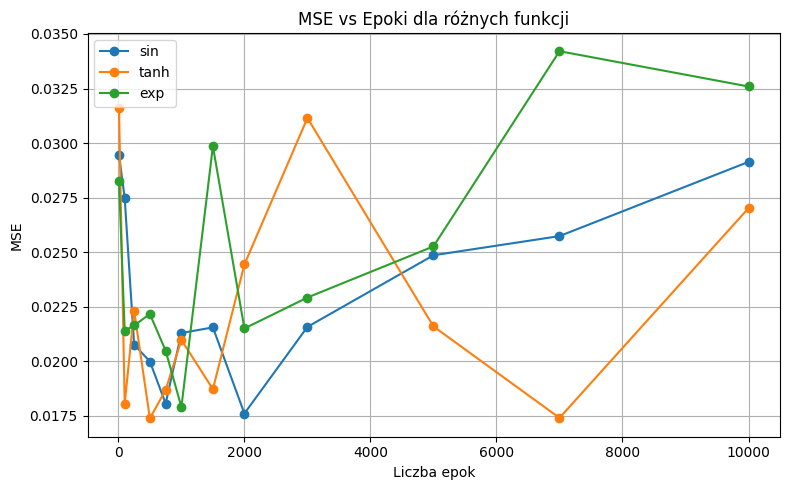

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# DataFrame z wynikami
df_results = pd.DataFrame(results)

# Znajdź najlepszą liczbę epok dla każdej funkcji (najniższe MSE)
best_per_func = df_results.loc[df_results.groupby("Funkcja")["MSE"].idxmin()]
display(best_per_func)

# Wykres MSE vs Epoki
plt.figure(figsize=(8, 5))
for func in df_results['Funkcja'].unique():
    subset = df_results[df_results['Funkcja'] == func].sort_values("Epoki")
    plt.plot(subset['Epoki'], subset['MSE'], label=func, marker='o')

plt.title("MSE vs Epoki dla różnych funkcji")
plt.xlabel("Liczba epok")
plt.ylabel("MSE")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("mse_vs_epochs.png")  


In [49]:
import numpy as np
import torch

def generate_ddpm_test_data(func_name, num_samples=1000, T=100, t_pred=50):
    x = np.linspace(-5, 5, num_samples)

    if func_name == 'sin':
        y = np.sin(x)
    elif func_name == 'exp':
        y = np.exp(x)
    else:
        raise ValueError("Obsługiwane tylko 'sin' i 'exp'")

    # Parametry DDPM
    betas = np.linspace(0.0001, 0.0002, T)
    alphas = 1 - betas
    alpha_bars = np.cumprod(alphas)
    alpha_bar_t = alpha_bars[t_pred]

    # Szum ε do testu
    epsilon = np.random.randn(num_samples)
    
    x_t = np.sqrt(alpha_bar_t) * y + np.sqrt(1 - alpha_bar_t) * epsilon

    # Zwróć dane
    return {
        "x": x,
        "x₀_true": y,
        "epsilon": epsilon,
        "x_t": x_t,
        "alpha_bar_t": alpha_bar_t,
        "t_norm": t_pred / T
    }


In [50]:
# Generowanie testu dla funkcji sin
test_data = generate_ddpm_test_data('sin', T=100, t_pred=50)

x_t_tensor = torch.tensor(test_data["x_t"], dtype=torch.float32).unsqueeze(1).to(device)
t_tensor = torch.full_like(x_t_tensor, test_data["t_norm"]).to(device)
model_input = torch.cat([x_t_tensor, t_tensor], dim=1)

model.eval()
with torch.no_grad():
    eps_pred = model(model_input).squeeze()
    x0_recon = (x_t_tensor.squeeze() - np.sqrt(1 - test_data["alpha_bar_t"]) * eps_pred) / \
               np.sqrt(test_data["alpha_bar_t"])

# Oblicz MSE względem prawdziwego x₀
from sklearn.metrics import mean_squared_error
mse_test = mean_squared_error(test_data["x₀_true"], x0_recon.cpu().numpy())
print("MSE (test):", mse_test)


MSE (test): 0.03022168615394838


Różnica między kodem wyżej a kodem niżej:
* wyżej testujemy mniej funkcji
* niżej mamy stałą liczbę epok, a wyżej testujemy epoki
* niżej odszumiamy dla całej próbki t_ddpm, a wyżej odszumianie następuje przy konkretnym t => łatwiej porównać efekty ale nie sprawdzamy jak dobrze model generalizuje do różnych t
* wyżej utrzymujemy jeden model na funkcje i kontynuuje trening, a niżej tworzymy osobny model dla każdej funkcji i architektury

## Punkt 3: Nauczenie odszumiania różnych funkcji - najbardziej obiecujące architektury

W tej sekcji:
- Wybierzemy 2 architektury z poprzednich wyników.
- Rozszerzymy zestaw funkcji do odszumiania.
- Zastosujemy strategie osobnych modeli dla każdej funkcji,
- Dodamy wygładzającą funkcję
  


 Trenuję funkcję sin dla architektury [32, 32]
 Czas treningu: 17.12s
 Trenuję funkcję sin dla architektury [64, 64, 64]
 Czas treningu: 20.14s


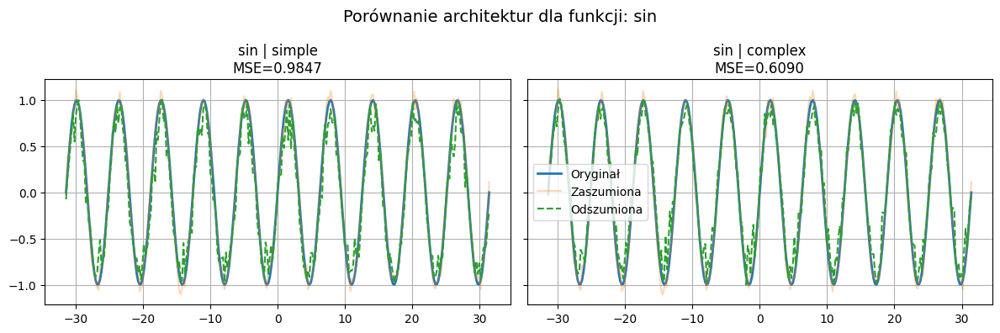

 Trenuję funkcję tan dla architektury [32, 32]
 Czas treningu: 21.37s
 Trenuję funkcję tan dla architektury [64, 64, 64]
 Czas treningu: 20.31s


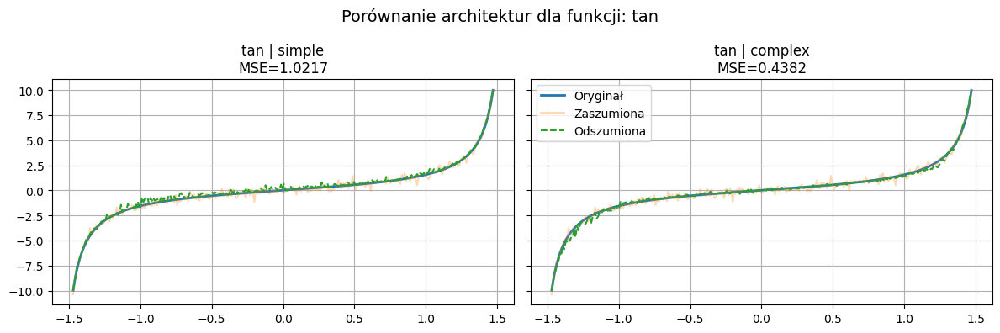

 Trenuję funkcję sgn dla architektury [32, 32]
 Czas treningu: 26.57s
 Trenuję funkcję sgn dla architektury [64, 64, 64]
 Czas treningu: 23.58s


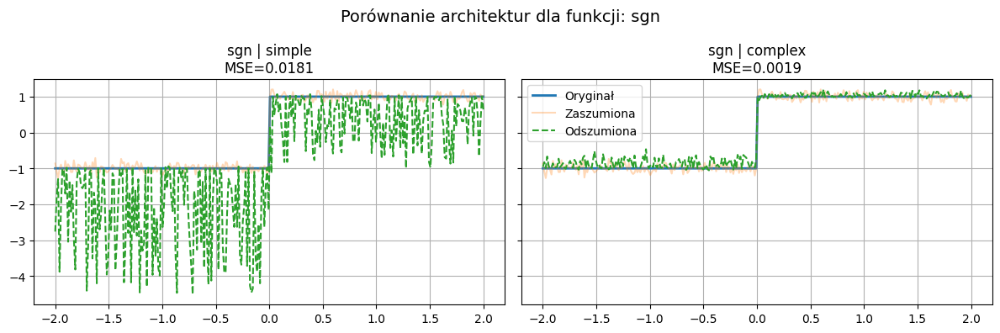

 Trenuję funkcję log2 dla architektury [32, 32]
 Czas treningu: 21.36s
 Trenuję funkcję log2 dla architektury [64, 64, 64]
 Czas treningu: 30.10s


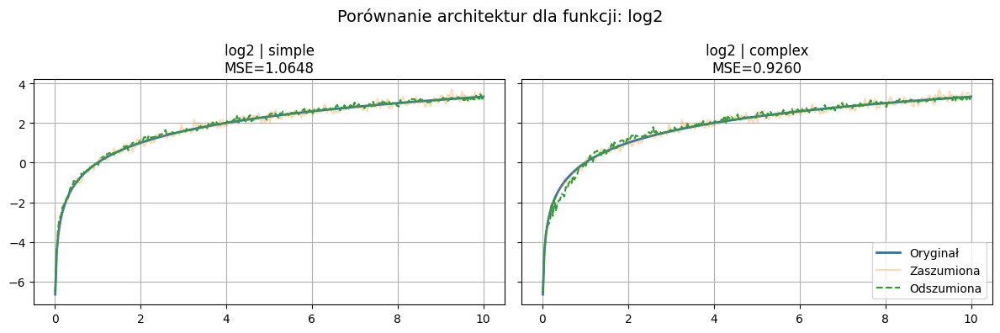

 Trenuję funkcję cube dla architektury [32, 32]
 Czas treningu: 25.01s
 Trenuję funkcję cube dla architektury [64, 64, 64]
 Czas treningu: 29.65s


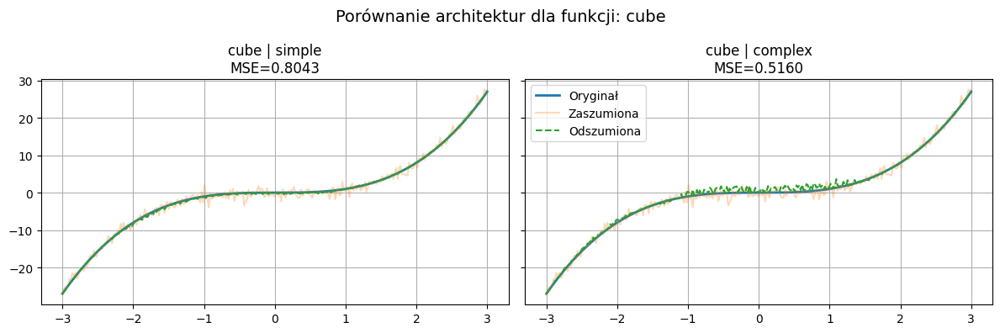

 Trenuję funkcję sin1/x dla architektury [32, 32]
 Czas treningu: 22.46s
 Trenuję funkcję sin1/x dla architektury [64, 64, 64]
 Czas treningu: 24.78s


FileNotFoundError: [Errno 2] No such file or directory: 'porownanie_sin1/x.png'

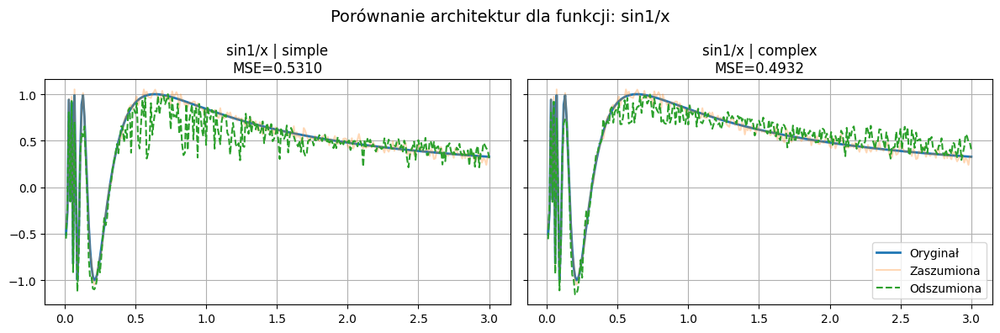

In [57]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import time
import matplotlib.pyplot as plt
import os
from torch.utils.data import TensorDataset, DataLoader
from scipy.signal import savgol_filter


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parametry DDPM
T = 100
beta_start = 0.0001
beta_end = 0.0002
betas = np.linspace(beta_start, beta_end, T)
alphas = 1 - betas
alpha_bars_np = np.cumprod(alphas)
alpha_bars = torch.tensor(alpha_bars_np, dtype=torch.float32).to(device)


# Model
class DenoisingMLP(nn.Module):
    def __init__(self, input_dim=2, hidden_layers=[64, 64], output_dim=1):
        super().__init__()
        layers = []
        dims = [input_dim] + hidden_layers + [output_dim]
        for i in range(len(dims)-1):
            layers.append(nn.Linear(dims[i], dims[i+1]))
            if i < len(dims)-2:
                layers.append(nn.ReLU())
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# Funkcja treningowa (DDPM)
def train_ddpm_model(x_t, t, epsilon, func_name, epochs, hidden_layers=[64, 64]):
    start_time = time.time()

    results = []
    x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
    t_tensor = torch.tensor(t, dtype=torch.float32).unsqueeze(1).to(device) / 1000
    eps_tensor = torch.tensor(epsilon, dtype=torch.float32).unsqueeze(1).to(device)
    inputs = torch.cat([x_t_tensor, t_tensor], dim=1)
    dataset = TensorDataset(inputs, eps_tensor)
    loader = DataLoader(dataset, batch_size=128, shuffle=True)

    # === Model inicjalizacja lub wczytanie ===
    model = DenoisingMLP(input_dim=2, hidden_layers=hidden_layers, output_dim=1).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    model_path = f"model_{func_name}_{'_'.join(map(str, hidden_layers))}.pt"
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print(f" Wczytano model: {model_path}")

    print(f" Trenuję funkcję {func_name} dla architektury {hidden_layers}")

    for epoch in range(epochs):
        model.train()
        for xb, yb in loader:
            pred = model(xb)
            loss = nn.MSELoss()(pred, yb)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    print(f" Czas treningu: {time.time() - start_time:.2f}s")


    results.append({'Funkcja': func_name, 'Epoki': epochs, 'Loss': loss.item()})
    
    return model, results

def generate_extended_data(func_name, num_samples=300):
    if func_name in ['sin', 'sin2', 'sinc', 'modulated']:
        x = np.linspace(-10 * np.pi, 10 * np.pi, num_samples)
    elif func_name == 'tan':
        x = np.linspace(-np.pi / 2 + 0.1, np.pi / 2 - 0.1, num_samples)
    elif func_name == 'sgn':
        x = np.linspace(-2, 2, num_samples)
    elif func_name == 'sigmoid':
        x = np.linspace(-10, 10, num_samples)
    elif func_name == 'relu':
        x = np.linspace(-5, 5, num_samples)
    elif func_name in ['log10', 'log2', 'inv']:
        x = np.linspace(0.01, 10, num_samples)
    elif func_name == 'exp':
        x = np.linspace(-2, 2, num_samples)
    elif func_name == 'linear':
        x = np.linspace(-5, 5, num_samples)
    elif func_name in ['square', 'cube', 'lin_comb']:
        x = np.linspace(-3, 3, num_samples)
    elif func_name == 'sin1/x':
        x = np.linspace(0.01, 3, num_samples)
    elif func_name == 'gaussian':
        x = np.linspace(-5, 5, num_samples)
    else:
        raise ValueError(f"Nieznana funkcja: {func_name}")

    y = extended_function_set(func_name, x)
    noise_level = 0.1 * np.std(y)
    noise = np.random.normal(0, noise_level, size=x.shape)
    y_noisy = y + noise
    return x, y, y_noisy

def extended_function_set(func_name, x):
    if func_name == 'sin': return np.sin(x)
    elif func_name == 'tan': return np.tan(x)
    elif func_name == 'sgn': return np.sign(x)
    elif func_name == 'sigmoid': return 1 / (1 + np.exp(-x))
    elif func_name == 'log2': return np.log2(np.clip(x, 1e-5, None))
    elif func_name == 'inv': return 1 / np.clip(x, 1e-5, None)
    elif func_name == 'exp': return np.exp(x)
    elif func_name == 'linear': return x
    elif func_name == 'cube': return x**3
    elif func_name == 'square': return x ** 2
    elif func_name == 'lin_comb':
        a, b = np.random.uniform(-3, 3), np.random.uniform(-3, 3)
        return a * x + b
    elif func_name == 'sin1/x': return np.sin(1 / np.clip(x, 1e-3, None))
    elif func_name == 'sin2': return np.sin(x)**2
    elif func_name == 'sinc': return np.sinc(x)
    elif func_name == 'gaussian': return np.exp(-x**2)
    elif func_name == 'modulated': return np.sin(x) * np.exp(-x**2)
    else: raise ValueError("Nieznana funkcja.")

# === Eksperymenty ===
functions_ext = ['sin', 'tan', 'sgn','log2','cube', 'sin1/x']
archs = {
    "simple": [32, 32],
    "complex": [64, 64, 64],
}
results_sep = []
epochs=2000

for func in functions_ext:
    x, y, y_noisy = generate_extended_data(func)

    t_ddpm = np.random.randint(1, T, size=len(y))
    epsilon_ddpm = np.random.randn(len(y))
    alpha_bar_t = alpha_bars_np[t_ddpm]
    alpha_bar_t_tensor = torch.tensor(alpha_bar_t, dtype=torch.float32).to(device)
    x_t = np.sqrt(alpha_bar_t) * y + np.sqrt(1 - alpha_bar_t) * epsilon_ddpm

    fig, axs = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

    for idx, (name, arch) in enumerate(archs.items()):
        model, training_results = train_ddpm_model(x_t, t_ddpm, epsilon_ddpm, func, epochs, hidden_layers=arch)

        last_result = training_results[-1]
        mse = last_result['Loss']
        epoki = last_result['Epoki']

        results_sep.append({'Funkcja': func, 'Architektura': name, 'MSE': mse, 'Epoki': epoki})

        model.eval()
        with torch.no_grad():
            x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
            t_tensor = torch.tensor(t_ddpm / T, dtype=torch.float32).unsqueeze(1).to(device)
            input_tensor = torch.cat([x_t_tensor, t_tensor], dim=1)
            eps_pred = model(input_tensor).squeeze()
            x0_recon = (x_t_tensor.squeeze() - torch.sqrt(1 - alpha_bar_t_tensor) * eps_pred) / \
                       torch.sqrt(alpha_bar_t_tensor)
            pred = x0_recon.cpu().numpy()

        # === WYKRES dla tej architektury ===
        ax = axs[idx]
        ax.plot(x, y, label='Oryginał', linewidth=2)
        ax.plot(x, y_noisy, label='Zaszumiona', alpha=0.3)
        ax.plot(x, pred, label='Odszumiona', linestyle='--')
        ax.set_title(f"{func} | {name}\nMSE={mse:.4f}")
        ax.grid(True)
        if idx == 1:
            ax.legend()

    plt.suptitle(f"Porównanie architektur dla funkcji: {func}", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"porownanie_{func}.png")
    plt.show()





 Trenuję funkcję sin dla architektury [32, 32]
 Czas treningu: 24.73s
 Trenuję funkcję sin dla architektury [64, 64, 64]
 Czas treningu: 22.37s
 Trenuję funkcję sgn dla architektury [32, 32]
 Czas treningu: 19.14s
 Trenuję funkcję sgn dla architektury [64, 64, 64]
 Czas treningu: 23.79s
 Trenuję funkcję tan dla architektury [32, 32]
 Czas treningu: 20.05s
 Trenuję funkcję tan dla architektury [64, 64, 64]
 Czas treningu: 25.04s
 Trenuję funkcję log2 dla architektury [32, 32]
 Czas treningu: 19.55s
 Trenuję funkcję log2 dla architektury [64, 64, 64]
 Czas treningu: 22.15s
 Trenuję funkcję cube dla architektury [32, 32]
 Czas treningu: 20.87s
 Trenuję funkcję cube dla architektury [64, 64, 64]
 Czas treningu: 21.59s
 Trenuję funkcję sin1/x dla architektury [32, 32]
 Czas treningu: 18.69s
 Trenuję funkcję sin1/x dla architektury [64, 64, 64]
 Czas treningu: 20.20s


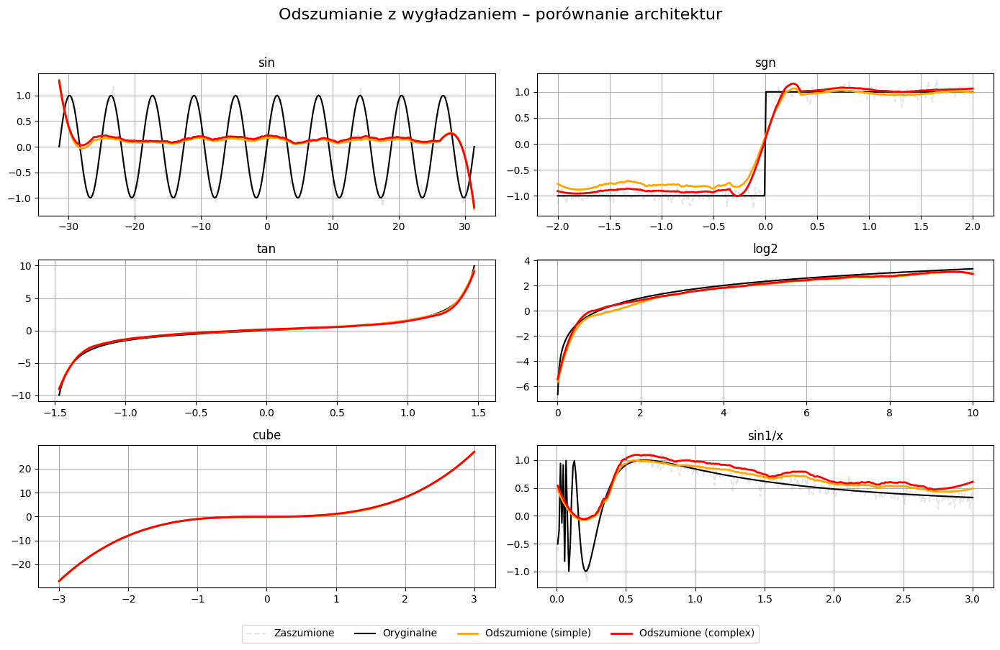

In [67]:
fig, axs = plt.subplots(nrows=(len(functions_ext) + 1) // 2, ncols=2, figsize=(14, 3 * ((len(functions_ext) + 1) // 2)))
axs = axs.flatten()

fig.suptitle(f"Odszumianie z wygładzaniem – porównanie architektur", fontsize=16)

legend_lines = []
legend_labels = []
colors = {"simple": "orange", "complex": "red"}

for idx, func in enumerate(functions_ext):
    x, y, y_noisy = generate_extended_data(func)

    t_ddpm = np.random.randint(1, T, size=len(y))
    epsilon_ddpm = np.random.randn(len(y))
    alpha_bar_t = alpha_bars_np[t_ddpm]
    alpha_bar_t_tensor = torch.tensor(alpha_bar_t, dtype=torch.float32).to(device)

    x_t = np.sqrt(alpha_bar_t) * y + np.sqrt(1 - alpha_bar_t) * epsilon_ddpm

    ax = axs[idx]
    ax.set_title(f"{func}")

    l1, = ax.plot(x, x_t, alpha=0.2, linestyle='--', label='Zaszumione', color='gray')
    l2, = ax.plot(x, y, linewidth=1.5, label='Oryginalne', color='black')

    if idx == 0:
        legend_lines = [l1, l2]
        legend_labels = [l.get_label() for l in legend_lines]

    for name, arch in archs.items():
        model, _ = train_ddpm_model(x_t, t_ddpm, epsilon_ddpm, func, epochs, hidden_layers=arch)

        model.eval()
        with torch.no_grad():
            x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
            t_tensor = torch.tensor(t_ddpm / T, dtype=torch.float32).unsqueeze(1).to(device)
            input_tensor = torch.cat([x_t_tensor, t_tensor], dim=1)
            eps_pred = model(input_tensor).squeeze()
            x0_recon = (x_t_tensor.squeeze() - torch.sqrt(1 - alpha_bar_t_tensor) * eps_pred) / \
                       torch.sqrt(alpha_bar_t_tensor)

        pred = x0_recon.cpu().numpy()

        # Wygładzanie predykcji
        window = 51 if len(pred) >= 51 else (len(pred) // 2 * 2 + 1)
        try:
            pred_smoothed = savgol_filter(pred, window_length=window, polyorder=3)
        except:
            pred_smoothed = pred

        l_arch, = ax.plot(x, pred_smoothed, color=colors[name], linewidth=2,
                          label=f"Odszumione ({name})")

        if idx == 0:
            legend_lines.append(l_arch)
            legend_labels.append(l_arch.get_label())

    ax.grid(True)

# Globalna legenda
fig.legend(legend_lines, legend_labels, loc='lower center', ncol=2 + len(archs), bbox_to_anchor=(0.5, -0.01), fontsize=10)

plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.show()


Różnica między kodem wyżej a niżej
* niżej tylko badamy sinusoidę
* niżej jest jedna architektura z wbudowanym embeddingiem
* wyżej mamy ciągła wartość przekazywania czasu t, a niżej używamy nn.Embedding(T,32), 
* wyżej zwykły model MLP a niżej MLP z embeddingiem co jest bardziej typowe dla DDPM
* wyżej obsługujemy checkpointy, niżej wszystko z RAM
* wyżej zaszumianie zaimplementowane ręcznie, niżej jako funkcja q_sample

## Punkt 4: Rozbudowa MLP do uproszczonego modelu dyfuzyjnego (DDPM-style)

W tej sekcji zbudujemy uproszczony model dyfuzyjny typu DDPM z MLP, w którym:
- dane są zaszumiane zgodnie z procesem forward diffusion (dodawanie szumu w krokach `t`),
- sieć uczy się odwzorowywać szum (`epsilon`) na podstawie `x_t` i `t`,
- korzystamy z funkcji straty: \( \mathcal{L}_{\text{simple}} = \| \epsilon - \epsilon_\theta(x_t, t) \|^2 \)



=== Trening: sin | simple | T=50, β=[0.0001, 0.0002] ===
 Czas treningu: 25.03s

=== Trening: sin | complex | T=50, β=[0.0001, 0.0002] ===
 Czas treningu: 23.41s


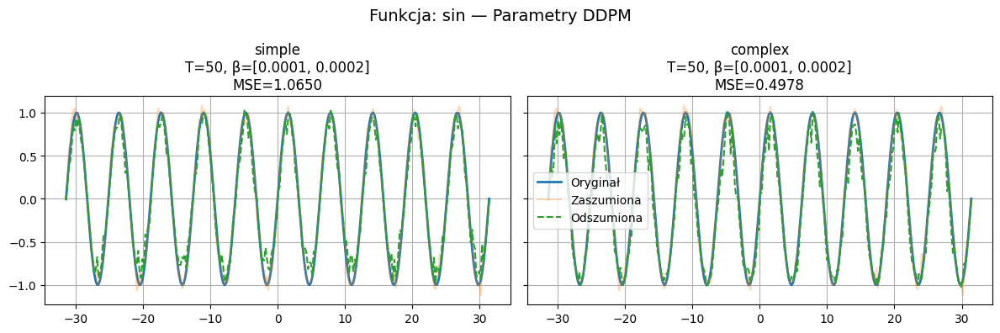


=== Trening: sin | simple | T=100, β=[0.0001, 0.0002] ===
 Czas treningu: 17.58s

=== Trening: sin | complex | T=100, β=[0.0001, 0.0002] ===
 Czas treningu: 19.22s


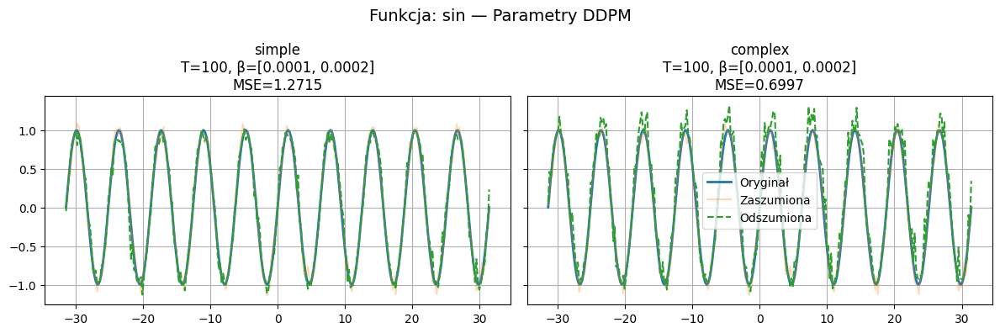


=== Trening: sin | simple | T=200, β=[0.0001, 0.002] ===
 Czas treningu: 16.84s

=== Trening: sin | complex | T=200, β=[0.0001, 0.002] ===
 Czas treningu: 20.70s


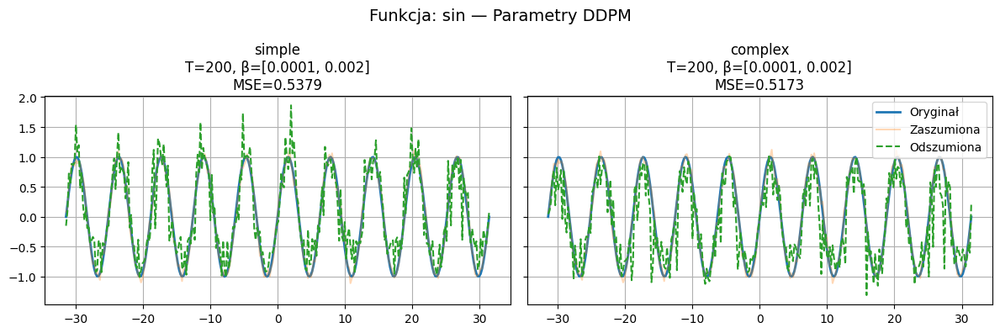


=== Trening: sin | simple | T=100, β=[0.0001, 0.02] ===
 Czas treningu: 17.15s

=== Trening: sin | complex | T=100, β=[0.0001, 0.02] ===
 Czas treningu: 19.71s


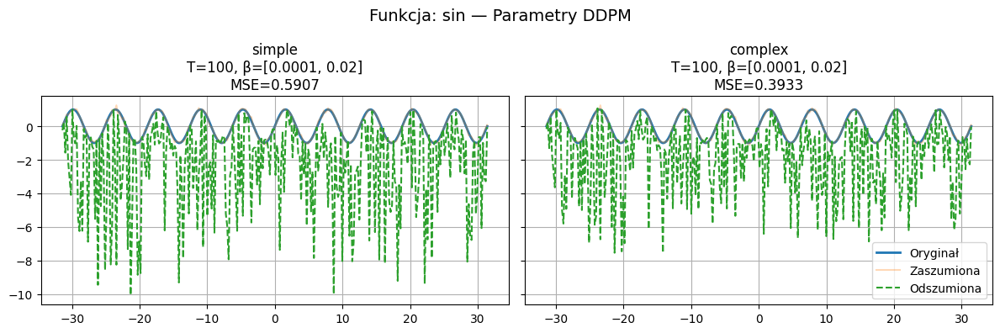


=== Trening: sin | simple | T=100, β=[0.001, 0.01] ===
 Czas treningu: 18.46s

=== Trening: sin | complex | T=100, β=[0.001, 0.01] ===
 Czas treningu: 20.43s


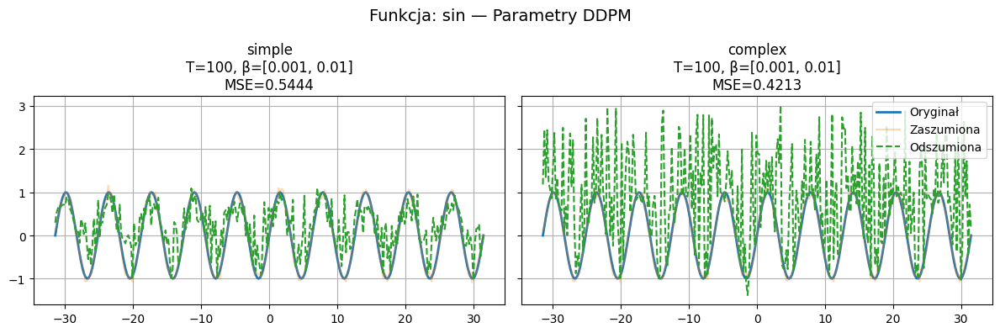

In [74]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import time
import matplotlib.pyplot as plt
import os
from torch.utils.data import TensorDataset, DataLoader
from scipy.signal import savgol_filter


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parametry DDPM
T = 100
beta_start = 0.0001
beta_end = 0.0002
betas = np.linspace(beta_start, beta_end, T)
alphas = 1 - betas
alpha_bars_np = np.cumprod(alphas)
alpha_bars = torch.tensor(alpha_bars_np, dtype=torch.float32).to(device)


# Model
class DenoisingMLP(nn.Module):
    def __init__(self, input_dim=2, hidden_layers=[64, 64], output_dim=1):
        super().__init__()
        layers = []
        dims = [input_dim] + hidden_layers + [output_dim]
        for i in range(len(dims)-1):
            layers.append(nn.Linear(dims[i], dims[i+1]))
            if i < len(dims)-2:
                layers.append(nn.ReLU())
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# Funkcja treningowa (DDPM)
def train_ddpm_model(x_t, t, epsilon, func_name, epochs, hidden_layers=[64, 64]):
    start_time = time.time()

    results = []
    x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
    t_tensor = torch.tensor(t, dtype=torch.float32).unsqueeze(1).to(device) / 1000
    eps_tensor = torch.tensor(epsilon, dtype=torch.float32).unsqueeze(1).to(device)
    inputs = torch.cat([x_t_tensor, t_tensor], dim=1)
    dataset = TensorDataset(inputs, eps_tensor)
    loader = DataLoader(dataset, batch_size=128, shuffle=True)

    # === Model inicjalizacja lub wczytanie ===
    model = DenoisingMLP(input_dim=2, hidden_layers=hidden_layers, output_dim=1).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    model_path = f"model_{func_name}_{'_'.join(map(str, hidden_layers))}.pt"
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print(f" Wczytano model: {model_path}")

    for epoch in range(epochs):
        model.train()
        for xb, yb in loader:
            pred = model(xb)
            loss = nn.MSELoss()(pred, yb)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    print(f" Czas treningu: {time.time() - start_time:.2f}s")


    results.append({'Funkcja': func_name, 'Epoki': epochs, 'Loss': loss.item()})
    
    return model, results

def generate_extended_data(func_name, num_samples=300):
    if func_name in ['sin', 'sin2', 'sinc', 'modulated']:
        x = np.linspace(-10 * np.pi, 10 * np.pi, num_samples)
    elif func_name == 'tan':
        x = np.linspace(-np.pi / 2 + 0.1, np.pi / 2 - 0.1, num_samples)
    elif func_name == 'sgn':
        x = np.linspace(-2, 2, num_samples)
    elif func_name == 'sigmoid':
        x = np.linspace(-10, 10, num_samples)
    elif func_name == 'relu':
        x = np.linspace(-5, 5, num_samples)
    elif func_name in ['log10', 'log2', 'inv']:
        x = np.linspace(0.01, 10, num_samples)
    elif func_name == 'exp':
        x = np.linspace(-2, 2, num_samples)
    elif func_name == 'linear':
        x = np.linspace(-5, 5, num_samples)
    elif func_name in ['square', 'cube', 'lin_comb']:
        x = np.linspace(-3, 3, num_samples)
    elif func_name == 'sin1/x':
        x = np.linspace(0.01, 3, num_samples)
    elif func_name == 'gaussian':
        x = np.linspace(-5, 5, num_samples)
    else:
        raise ValueError(f"Nieznana funkcja: {func_name}")

    y = extended_function_set(func_name, x)
    noise_level = 0.1 * np.std(y)
    noise = np.random.normal(0, noise_level, size=x.shape)
    y_noisy = y + noise
    return x, y, y_noisy

def extended_function_set(func_name, x):
    if func_name == 'sin': return np.sin(x)
    elif func_name == 'tan': return np.tan(x)
    elif func_name == 'sgn': return np.sign(x)
    elif func_name == 'sigmoid': return 1 / (1 + np.exp(-x))
    elif func_name == 'log2': return np.log2(np.clip(x, 1e-5, None))
    elif func_name == 'inv': return 1 / np.clip(x, 1e-5, None)
    elif func_name == 'exp': return np.exp(x)
    elif func_name == 'linear': return x
    elif func_name == 'cube': return x**3
    elif func_name == 'square': return x ** 2
    elif func_name == 'lin_comb':
        a, b = np.random.uniform(-3, 3), np.random.uniform(-3, 3)
        return a * x + b
    elif func_name == 'sin1/x': return np.sin(1 / np.clip(x, 1e-3, None))
    elif func_name == 'sin2': return np.sin(x)**2
    elif func_name == 'sinc': return np.sinc(x)
    elif func_name == 'gaussian': return np.exp(-x**2)
    elif func_name == 'modulated': return np.sin(x) * np.exp(-x**2)
    else: raise ValueError("Nieznana funkcja.")

# === Eksperymenty z różnymi parametrami DDPM ===
functions_ext = ['sin']
archs = {
    "simple": [32, 32],
    "complex": [64, 64, 64],
}
epochs = 2000

# Definiujemy różne konfiguracje T i beta
configs = [
    {"T": 50, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 200, "beta_start": 0.0001, "beta_end": 0.002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.02},
    {"T": 100, "beta_start": 0.001, "beta_end": 0.01},
]

results_sep = []

for config in configs:
    T = config["T"]
    beta_start = config["beta_start"]
    beta_end = config["beta_end"]

    betas = np.linspace(beta_start, beta_end, T)
    alphas = 1 - betas
    alpha_bars_np = np.cumprod(alphas)
    alpha_bars = torch.tensor(alpha_bars_np, dtype=torch.float32).to(device)

    for func in functions_ext:
        x, y, y_noisy = generate_extended_data(func)

        t_ddpm = np.random.randint(1, T, size=len(y))
        epsilon_ddpm = np.random.randn(len(y))
        alpha_bar_t = alpha_bars_np[t_ddpm]
        alpha_bar_t_tensor = torch.tensor(alpha_bar_t, dtype=torch.float32).to(device)
        x_t = np.sqrt(alpha_bar_t) * y + np.sqrt(1 - alpha_bar_t) * epsilon_ddpm

        fig, axs = plt.subplots(1, len(archs), figsize=(6 * len(archs), 4), sharey=True)

        for idx, (name, arch) in enumerate(archs.items()):
            print(f"\n=== Trening: {func} | {name} | T={T}, β=[{beta_start}, {beta_end}] ===")
            model, training_results = train_ddpm_model(x_t, t_ddpm, epsilon_ddpm,
                                                       f"{func}_{name}_T{T}_b{beta_start}_{beta_end}",
                                                       epochs,
                                                       hidden_layers=arch)

            last_result = training_results[-1]
            mse = last_result['Loss']
            epoki = last_result['Epoki']

            results_sep.append({
                'Funkcja': func,
                'Architektura': name,
                'MSE': mse,
                'Epoki': epoki,
                'T': T,
                'Beta_start': beta_start,
                'Beta_end': beta_end
            })

            model.eval()
            with torch.no_grad():
                x_t_tensor = torch.tensor(x_t, dtype=torch.float32).unsqueeze(1).to(device)
                t_tensor = torch.tensor(t_ddpm / T, dtype=torch.float32).unsqueeze(1).to(device)
                input_tensor = torch.cat([x_t_tensor, t_tensor], dim=1)
                eps_pred = model(input_tensor).squeeze()
                x0_recon = (x_t_tensor.squeeze() - torch.sqrt(1 - alpha_bar_t_tensor) * eps_pred) / \
                           torch.sqrt(alpha_bar_t_tensor)
                pred = x0_recon.cpu().numpy()

            # === WYKRES ===
            ax = axs[idx] if len(archs) > 1 else axs
            ax.plot(x, y, label='Oryginał', linewidth=2)
            ax.plot(x, y_noisy, label='Zaszumiona', alpha=0.3)
            ax.plot(x, pred, label='Odszumiona', linestyle='--')
            ax.set_title(f"{name}\nT={T}, β=[{beta_start}, {beta_end}]\nMSE={mse:.4f}")
            ax.grid(True)
            if idx == len(archs) - 1:
                ax.legend()

        plt.suptitle(f"Funkcja: {func} — Parametry DDPM", fontsize=14)
        plt.tight_layout()
        plt.savefig(f"porownanie_{func}_T{T}_b{beta_start}_{beta_end}.png")
        plt.show()


Trenuję model z T=50, beta_start=0.0001, beta_end=0.0002


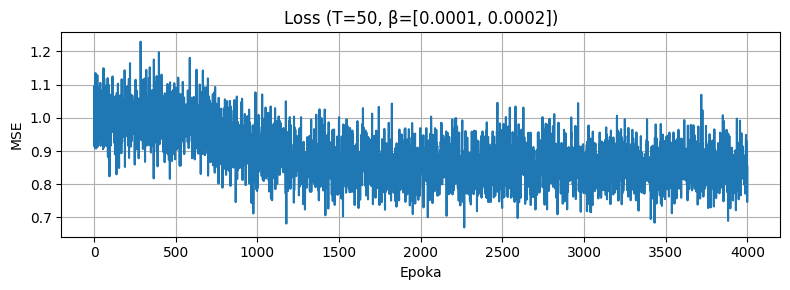

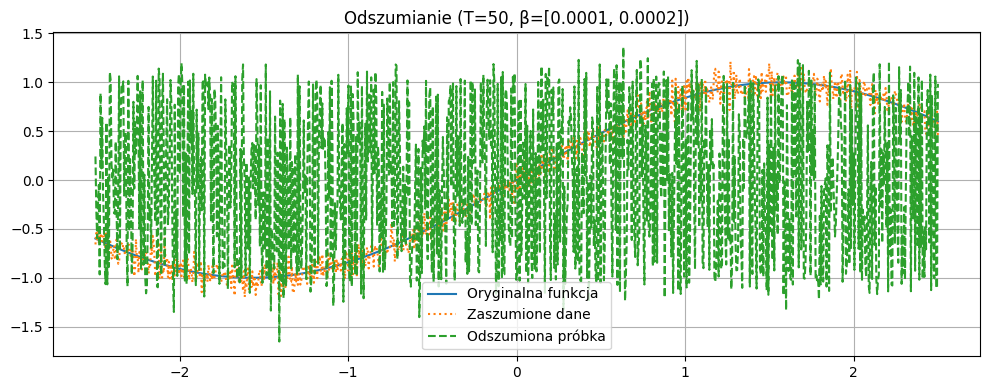

Trenuję model z T=200, beta_start=0.0001, beta_end=0.0002


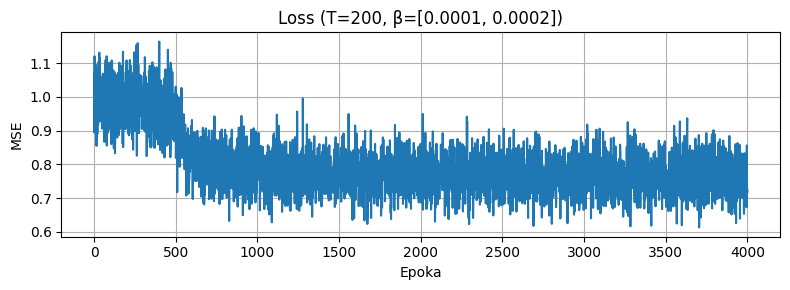

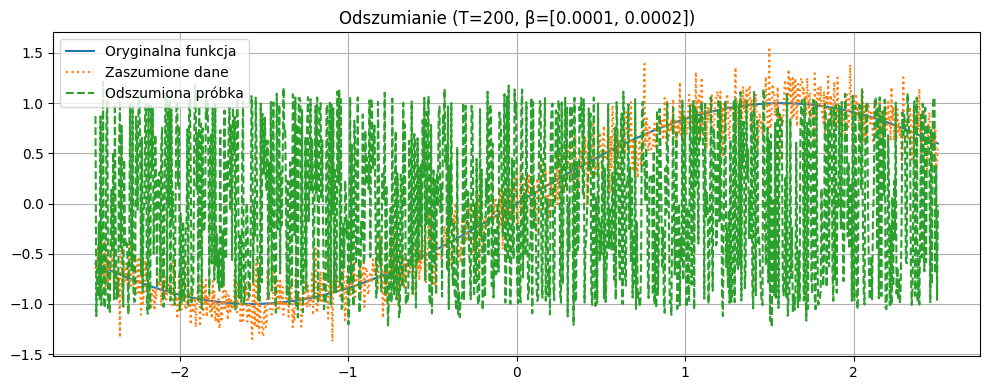

Trenuję model z T=500, beta_start=0.0001, beta_end=0.0002


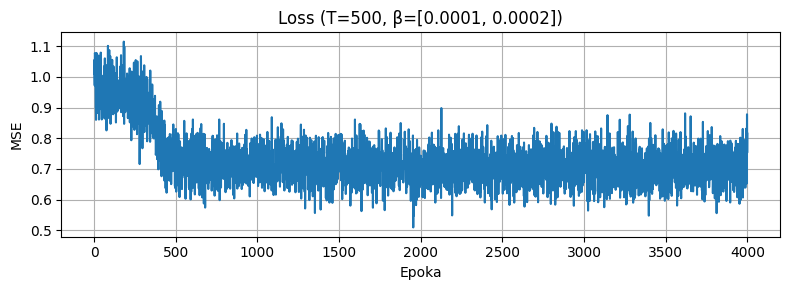

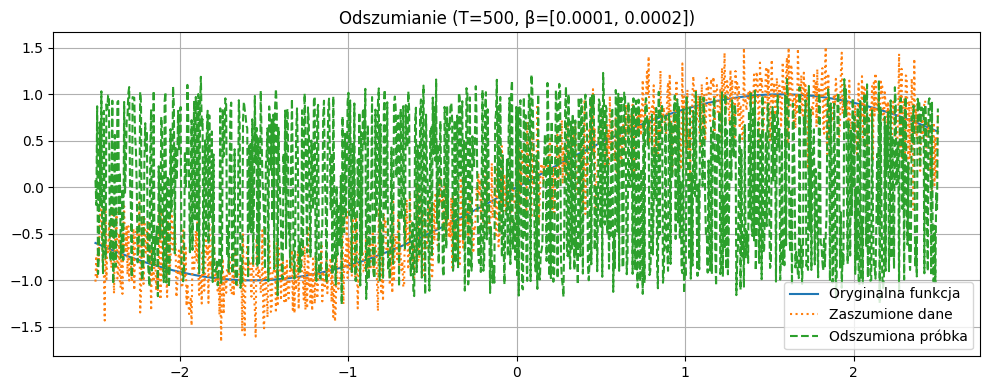

Trenuję model z T=700, beta_start=0.0001, beta_end=0.0002


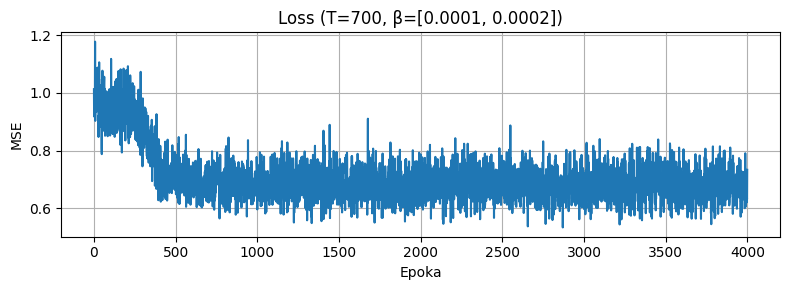

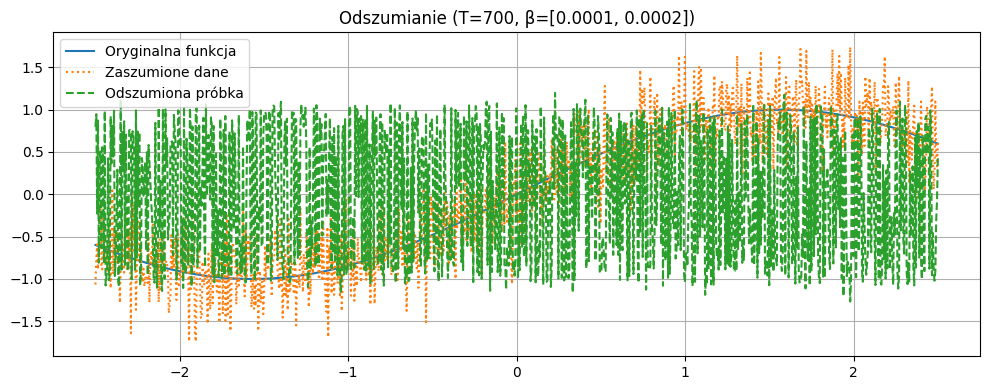

Trenuję model z T=100, beta_start=0.0001, beta_end=0.002


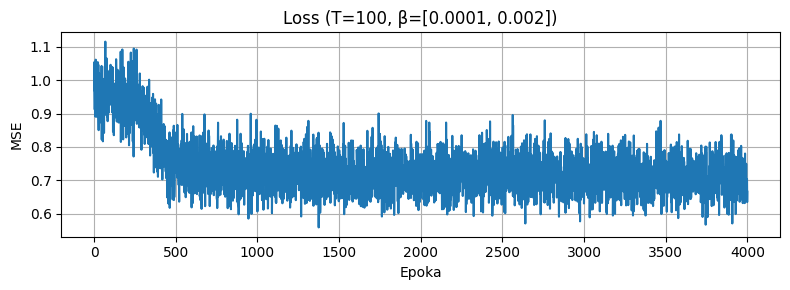

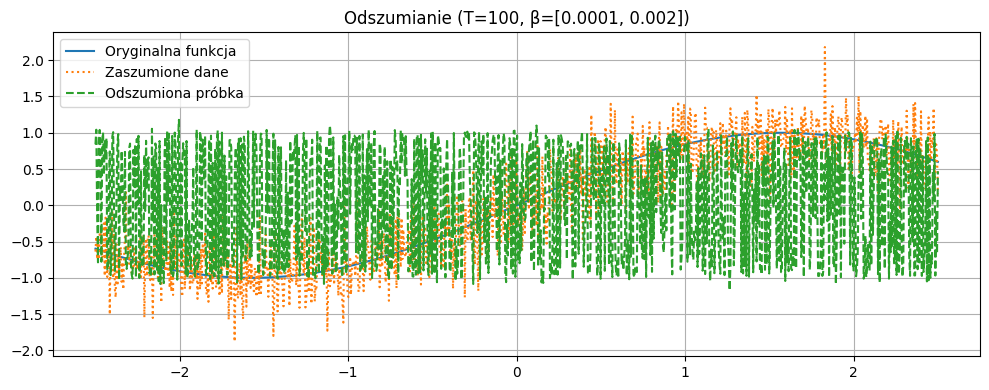

Trenuję model z T=100, beta_start=0.0001, beta_end=0.02


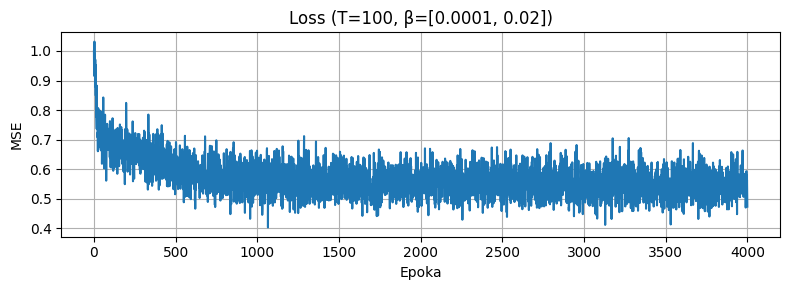

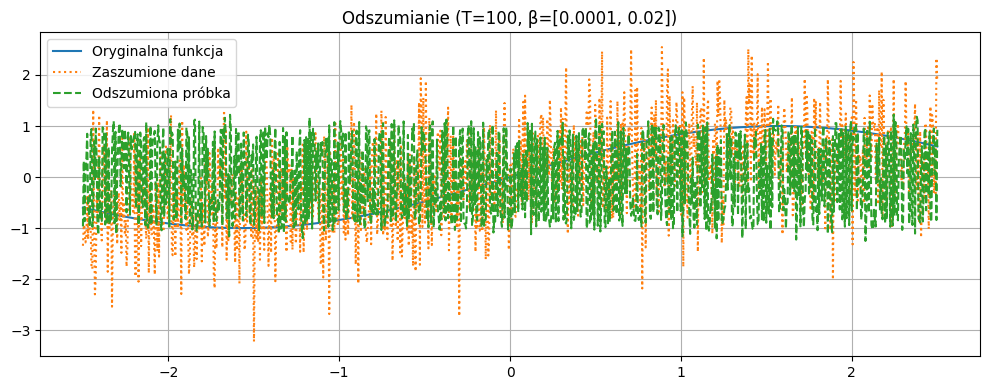

Trenuję model z T=100, beta_start=0.001, beta_end=0.002


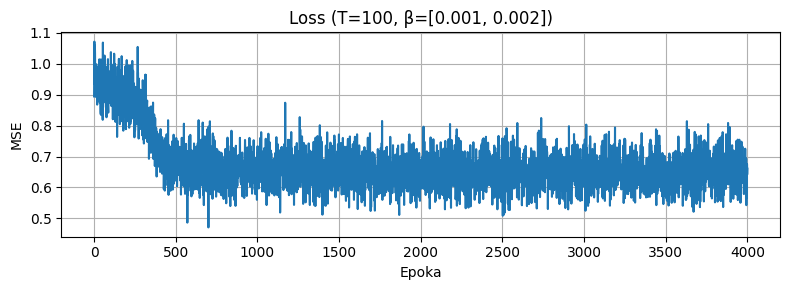

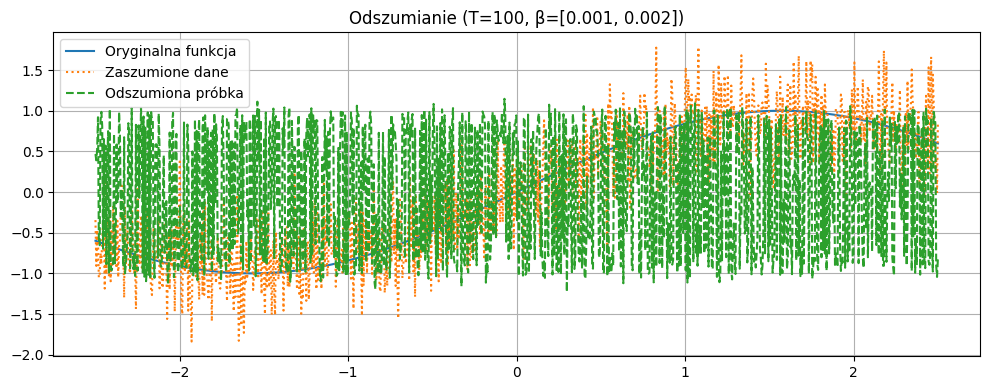

Trenuję model z T=100, beta_start=0.01, beta_end=0.02


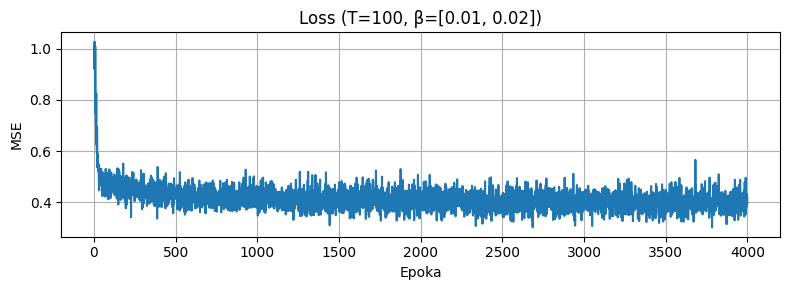

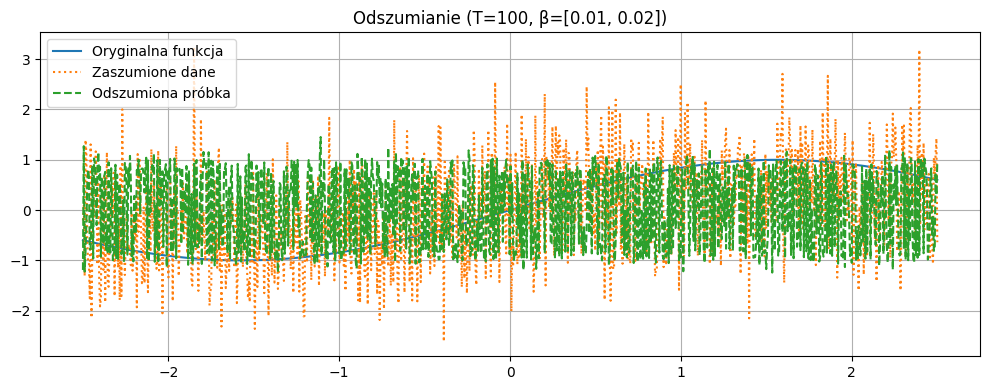

Trenuję model z T=500, beta_start=0.0001, beta_end=0.002


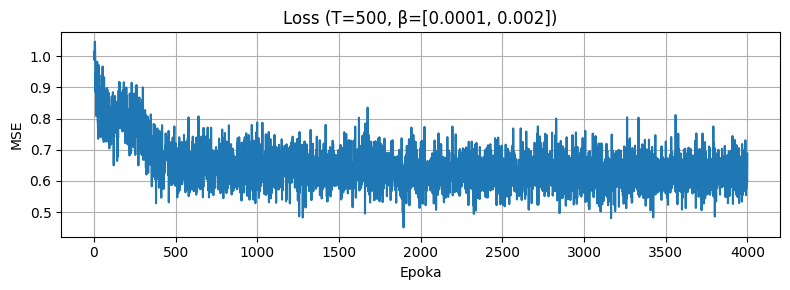

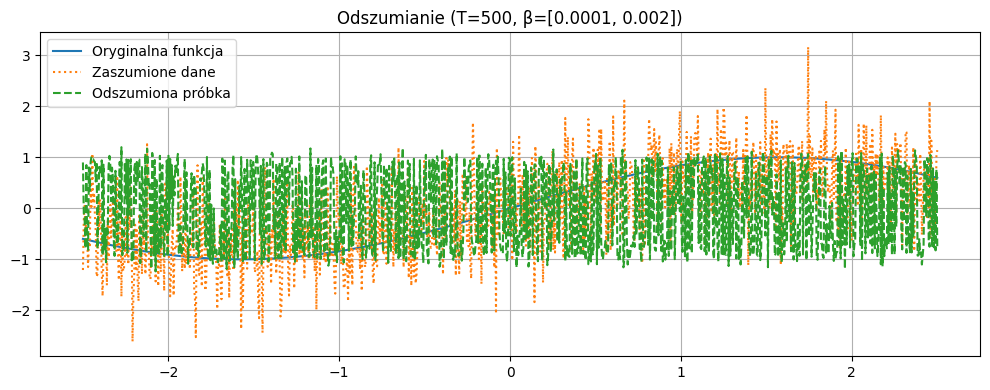

Trenuję model z T=500, beta_start=0.0001, beta_end=0.02


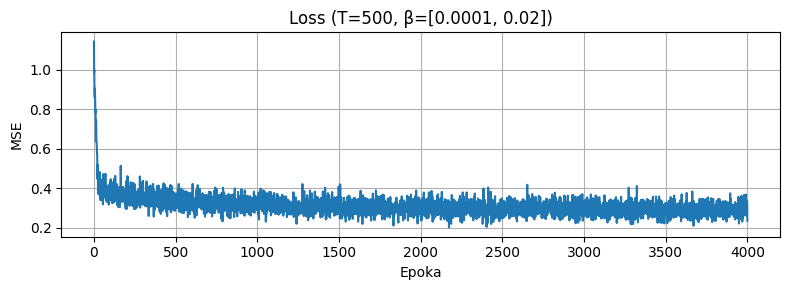

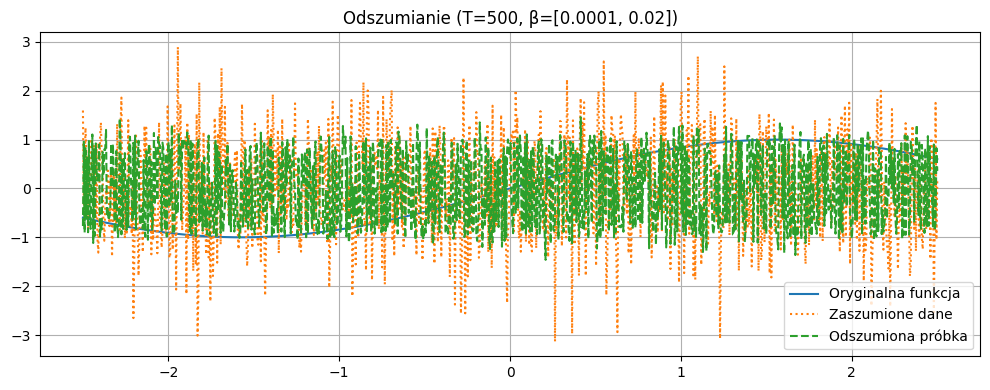

Trenuję model z T=500, beta_start=0.001, beta_end=0.002


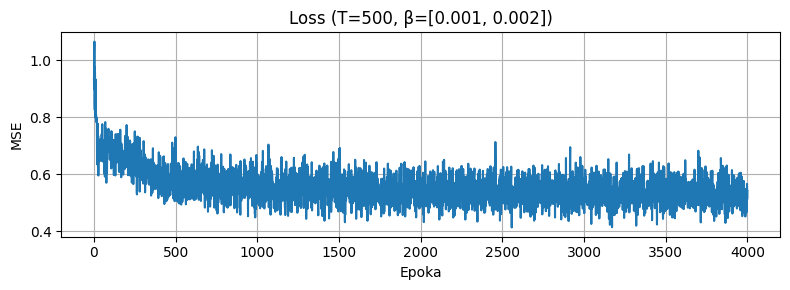

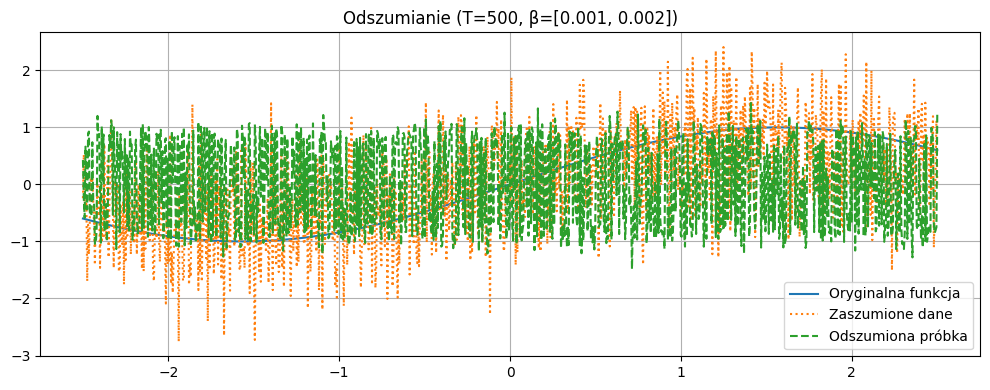

Trenuję model z T=500, beta_start=0.01, beta_end=0.02


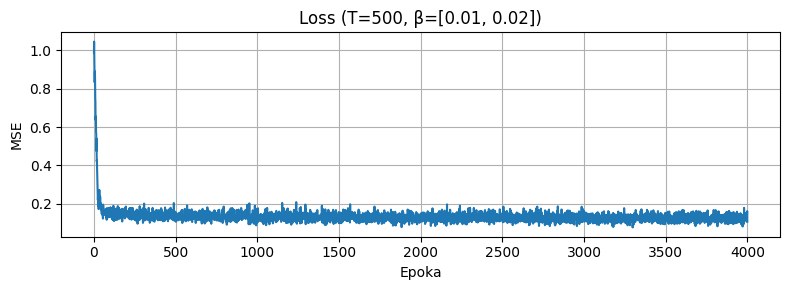

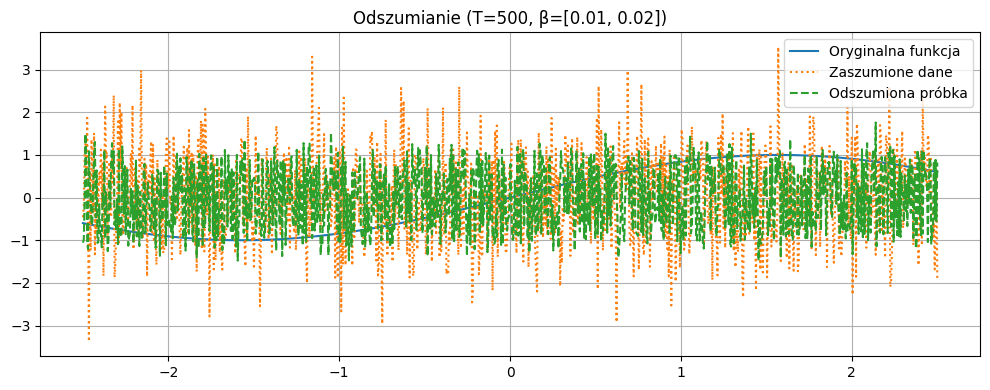

In [70]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Funkcja zaszumiająca
def q_sample(x0, t, alpha_bars, noise):
    sqrt_alpha_bar = torch.sqrt(alpha_bars[t]).view(-1, 1)
    sqrt_one_minus = torch.sqrt(1 - alpha_bars[t]).view(-1, 1)
    return sqrt_alpha_bar * x0 + sqrt_one_minus * noise


# Dyfuzyjny MLP z dynamicznym T
class DiffusionMLP(nn.Module):
    def __init__(self, T, hidden=[128, 128]):
        super().__init__()
        self.embed_time = nn.Embedding(T, 32)
        self.net = nn.Sequential(
            nn.Linear(1 + 32, hidden[0]),
            nn.ReLU(),
            nn.Linear(hidden[0], hidden[1]),
            nn.ReLU(),
            nn.Linear(hidden[1], 1)
        )

    def forward(self, x, t):
        t_embed = self.embed_time(t)
        x_input = torch.cat([x, t_embed], dim=1)
        return self.net(x_input)


# Funkcja treningowa
def train_diffusion_model(x0_np, T, beta_start, beta_end, epochs=20000):
    x0 = torch.tensor(x0_np, dtype=torch.float32).unsqueeze(1).to(device)

    betas = torch.linspace(beta_start, beta_end, T, device=device)
    alphas = 1. - betas
    alpha_bars = torch.cumprod(alphas, dim=0)

    model = DiffusionMLP(T=T).to(device)
    #model = torch.compile(model)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()
    losses = []

    dataset = TensorDataset(x0)
    loader = DataLoader(dataset, batch_size=512, shuffle=True)
    for epoch in range(epochs):
        for xb, in loader:
            t = torch.randint(0, T, (xb.shape[0],), device=device)
            noise = torch.randn_like(xb)
            xt = q_sample(xb, t, alpha_bars, noise)
            pred_noise = model(xt, t)
            loss = loss_fn(pred_noise, noise)
            losses.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    return model, alpha_bars, betas, losses


# Sampling
@torch.no_grad()
def sample_from_model(model, T, alpha_bars, betas, alphas):
    x = torch.randn(1000, 1).to(device)

    for t in reversed(range(T)):
        t_tensor = torch.full((x.shape[0],), t, dtype=torch.long, device=device)
        beta_t = betas[t].clone().detach()
        alpha_t = alphas[t].clone().detach()
        alpha_bar_t = alpha_bars[t].clone().detach()

        sqrt_recip_alpha = 1. / torch.sqrt(alpha_t)
        sqrt_inv_one_minus = beta_t / torch.sqrt(1 - alpha_bar_t)

        eps_theta = model(x, t_tensor)
        z = torch.randn_like(x) if t > 0 else torch.zeros_like(x)
        sigma_t = torch.sqrt(beta_t)
        x = sqrt_recip_alpha * (x - sqrt_inv_one_minus * eps_theta) + sigma_t * z

    return x


# === Eksperymenty ===
x_vals = np.linspace(-2.5, 2.5, 1000)
y_vals = np.sin(x_vals)

# Testowane konfiguracje
configs = [
    {"T": 50, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 200, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 700, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.02},
    {"T": 100, "beta_start": 0.001, "beta_end": 0.002},
    {"T": 100, "beta_start": 0.01, "beta_end": 0.02},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.002},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.02},
    {"T": 500, "beta_start": 0.001, "beta_end": 0.002},
    {"T": 500, "beta_start": 0.01, "beta_end": 0.02},
]

for config in configs:
    print(f"Trenuję model z T={config['T']}, beta_start={config['beta_start']}, beta_end={config['beta_end']}")

    model, alpha_bars, betas, losses = train_diffusion_model(
        y_vals,
        T=config["T"],
        beta_start=config["beta_start"],
        beta_end=config["beta_end"],
        epochs=2000
    )

    alphas = 1 - betas
    samples = sample_from_model(model, config["T"], alpha_bars, betas, alphas).cpu().squeeze().numpy()
    t_test = torch.tensor([config["T"] - 1] * len(y_vals), device=device)
    x0_tensor = torch.tensor(y_vals, dtype=torch.float32).unsqueeze(1).to(device)
    noise = torch.randn_like(x0_tensor)
    xt = q_sample(x0_tensor, t_test, alpha_bars, noise).detach().cpu().numpy().squeeze()


    # Wykres loss
    plt.figure(figsize=(8, 3))
    plt.plot(losses)
    plt.title(f"Loss (T={config['T']}, β=[{config['beta_start']}, {config['beta_end']}])")
    plt.xlabel("Epoka")
    plt.ylabel("MSE")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Wykres generowanych danych
    plt.figure(figsize=(10, 4))
    plt.plot(x_vals, y_vals, label="Oryginalna funkcja")
    plt.plot(x_vals, xt, label="Zaszumione dane", linestyle=":")
    plt.plot(x_vals, samples, label="Odszumiona próbka", linestyle="--")
    plt.title(f"Odszumianie (T={config['T']}, β=[{config['beta_start']}, {config['beta_end']}])")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    


Trenuję model z T=50, beta_start=0.0001, beta_end=0.0002
Test MSE noise prediction: 0.767616


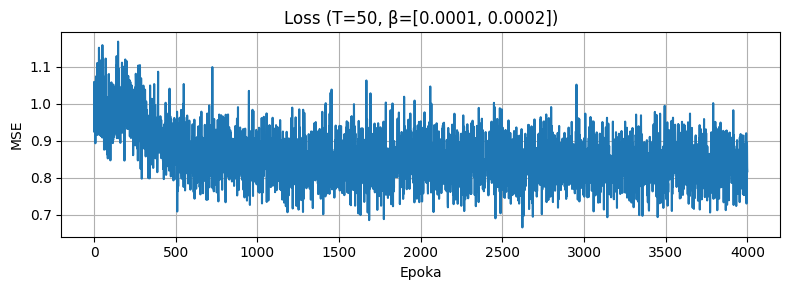

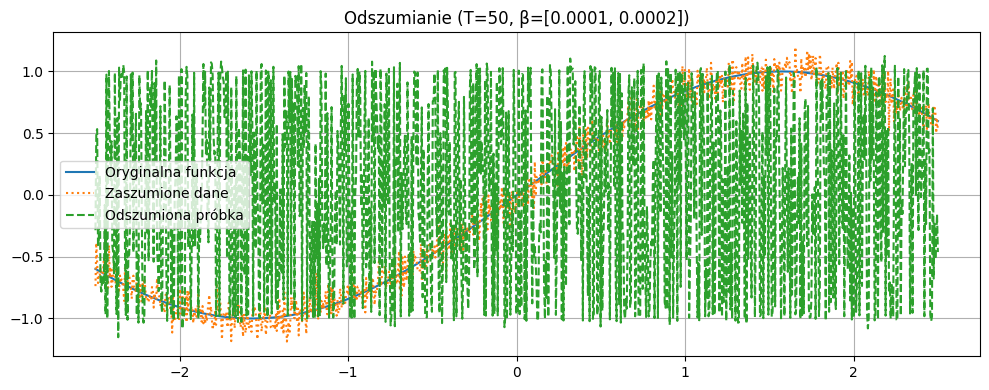

Trenuję model z T=200, beta_start=0.0001, beta_end=0.0002
Test MSE noise prediction: 0.772813


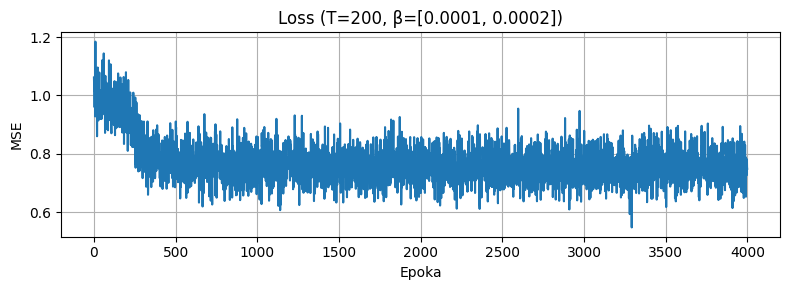

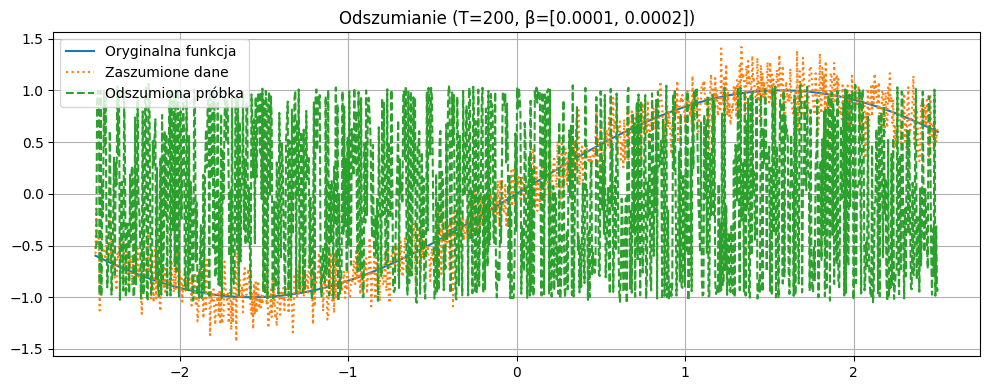

Trenuję model z T=500, beta_start=0.0001, beta_end=0.0002
Test MSE noise prediction: 0.696641


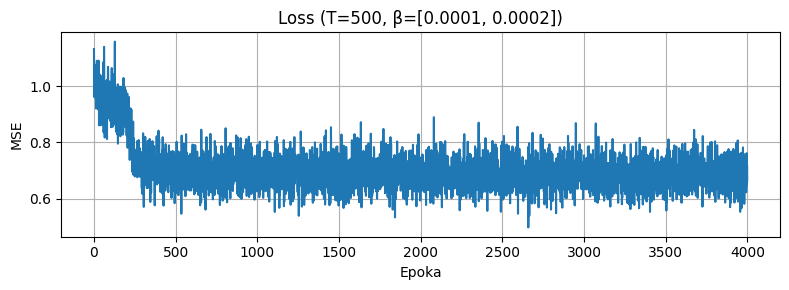

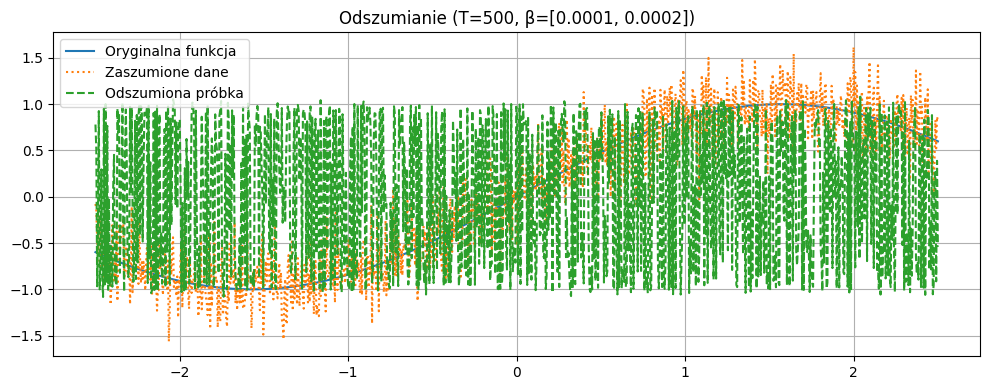

Trenuję model z T=700, beta_start=0.0001, beta_end=0.0002
Test MSE noise prediction: 0.691680


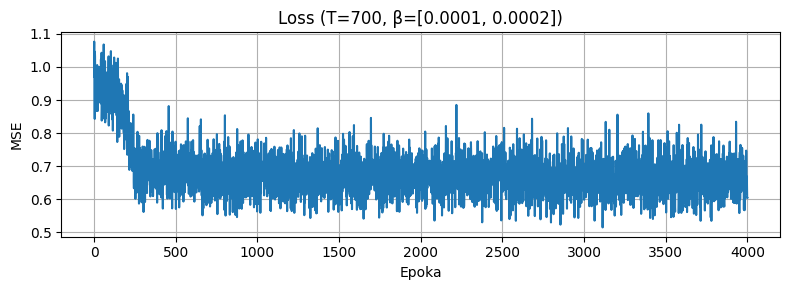

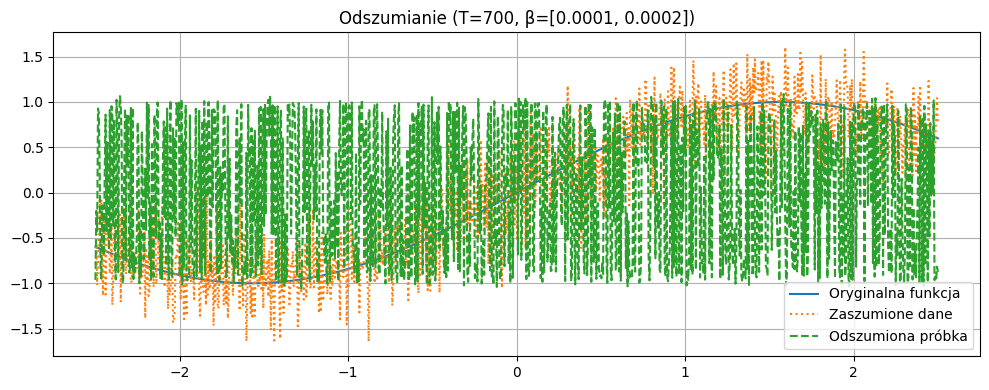

Trenuję model z T=100, beta_start=0.0001, beta_end=0.002
Test MSE noise prediction: 0.717655


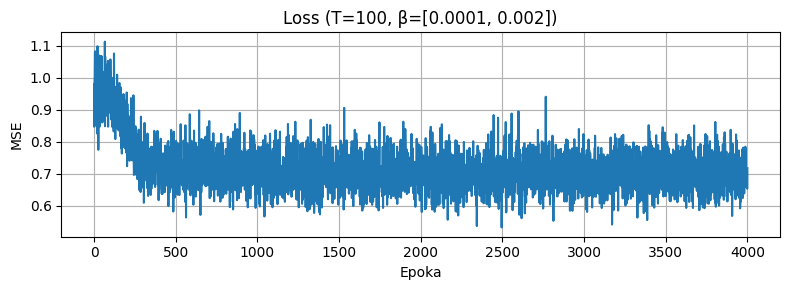

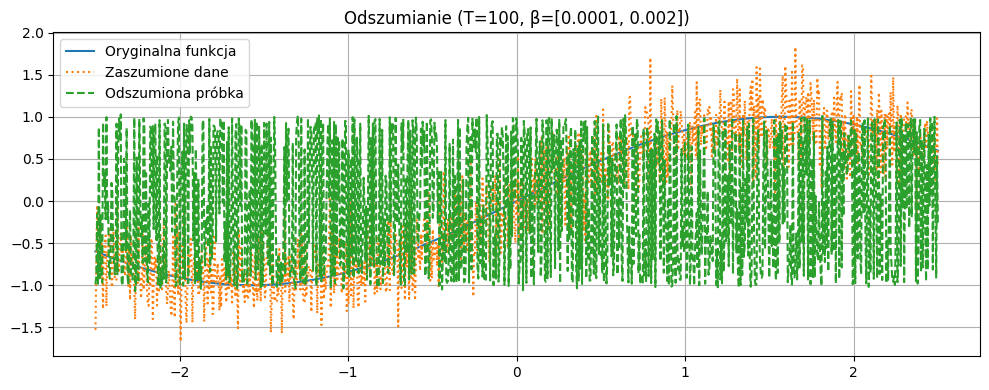

Trenuję model z T=100, beta_start=0.0001, beta_end=0.02
Test MSE noise prediction: 0.640171


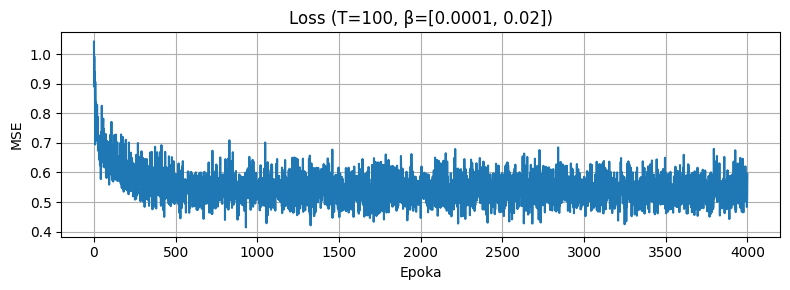

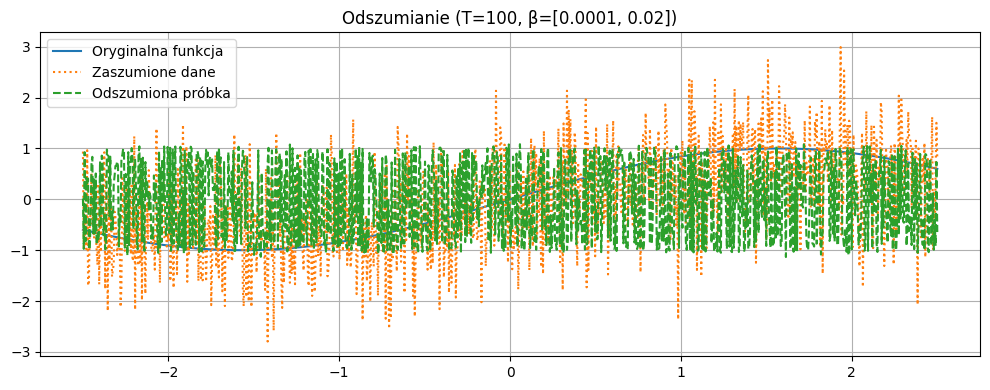

Trenuję model z T=100, beta_start=0.001, beta_end=0.002
Test MSE noise prediction: 0.613900


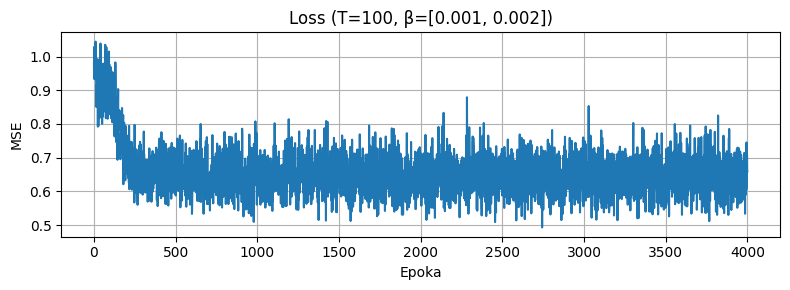

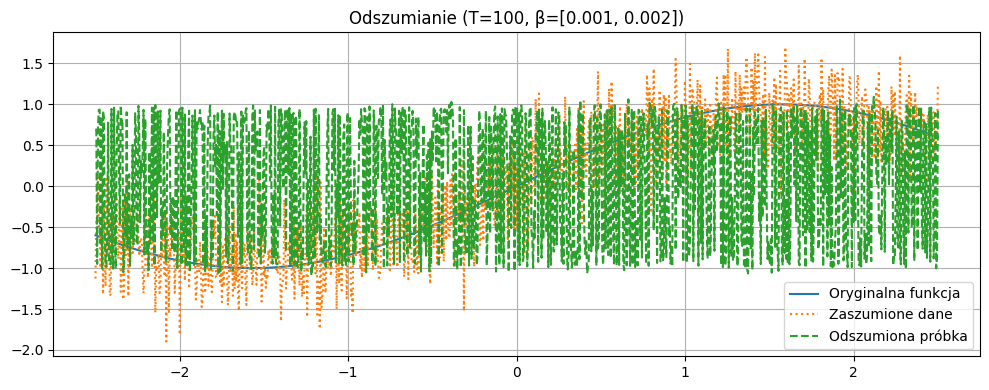

Trenuję model z T=100, beta_start=0.01, beta_end=0.02
Test MSE noise prediction: 0.398204


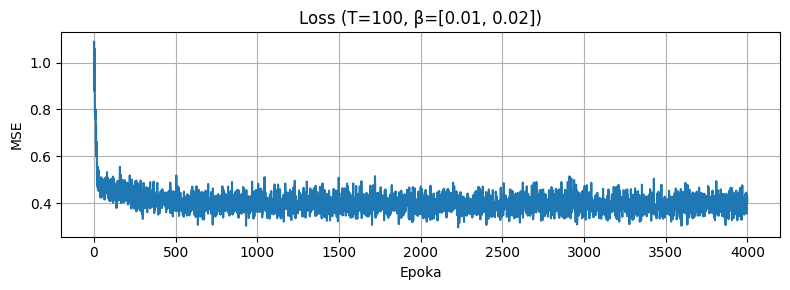

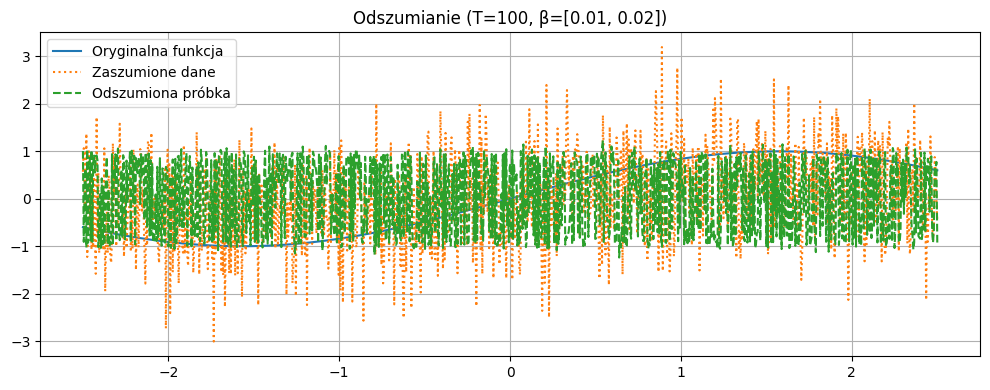

Trenuję model z T=500, beta_start=0.0001, beta_end=0.002
Test MSE noise prediction: 0.641216


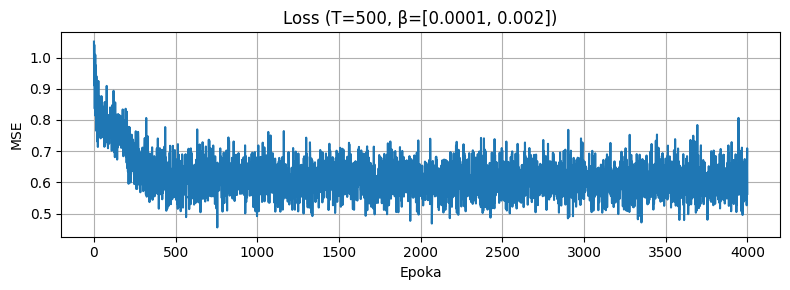

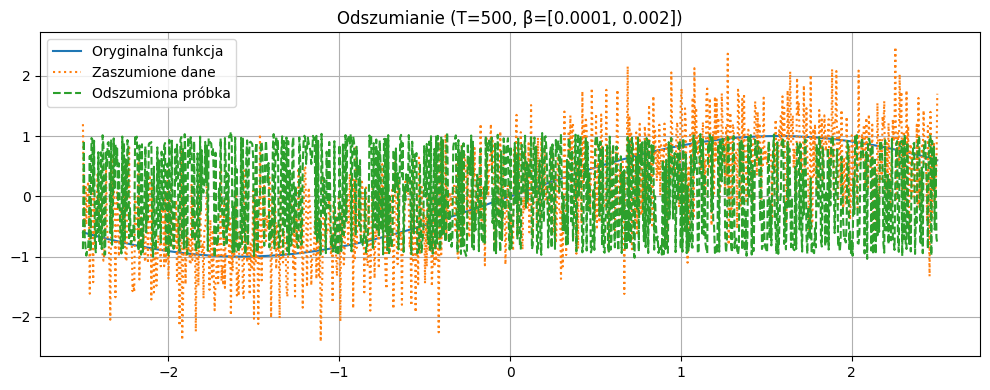

Trenuję model z T=500, beta_start=0.0001, beta_end=0.02
Test MSE noise prediction: 0.276932


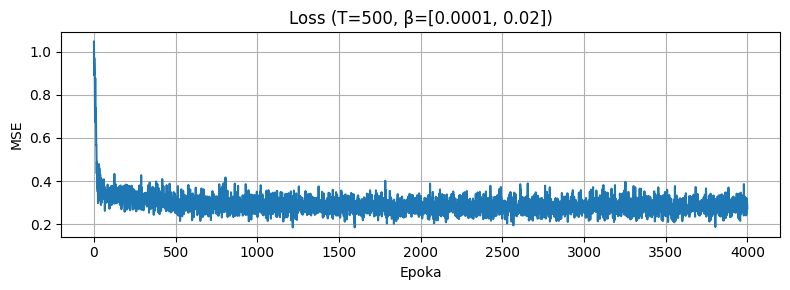

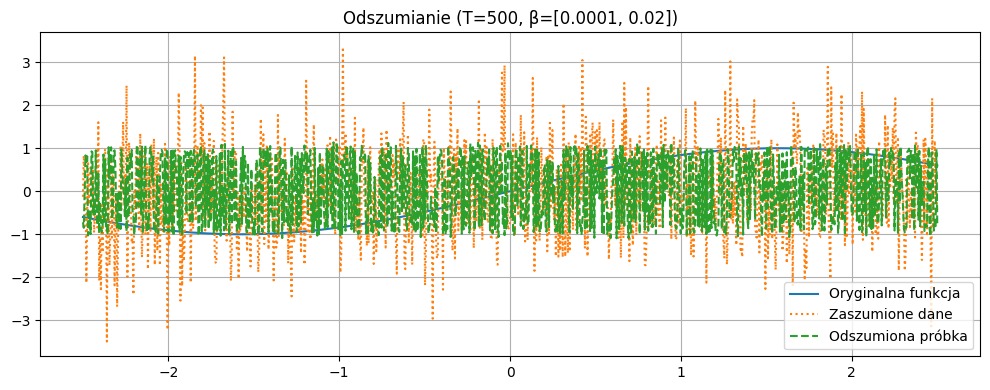

Trenuję model z T=500, beta_start=0.001, beta_end=0.002
Test MSE noise prediction: 0.563988


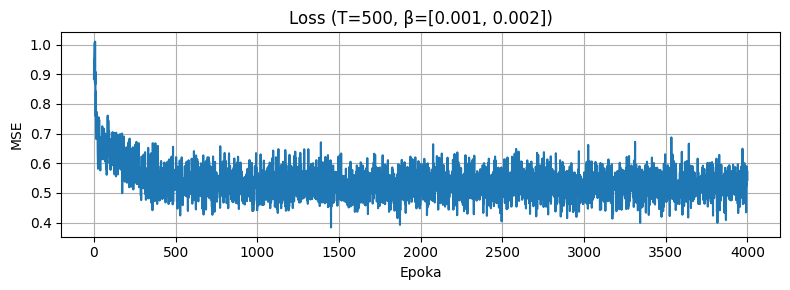

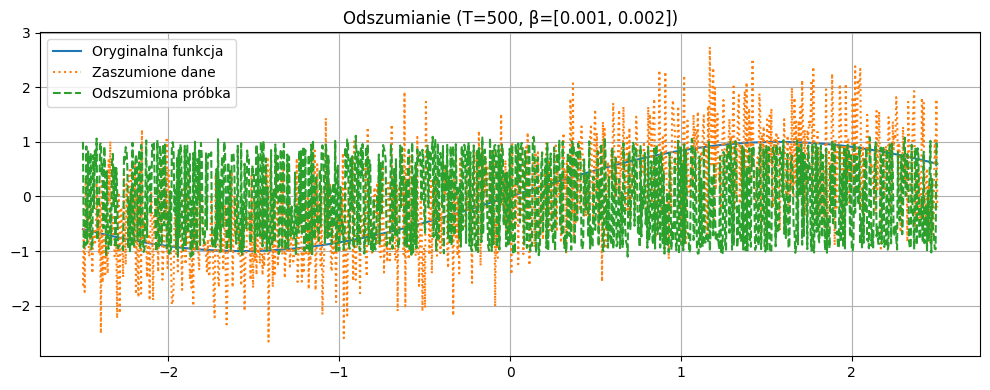

Trenuję model z T=500, beta_start=0.01, beta_end=0.02
Test MSE noise prediction: 0.127883


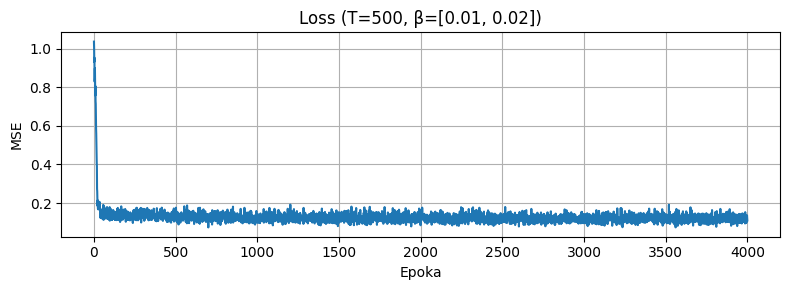

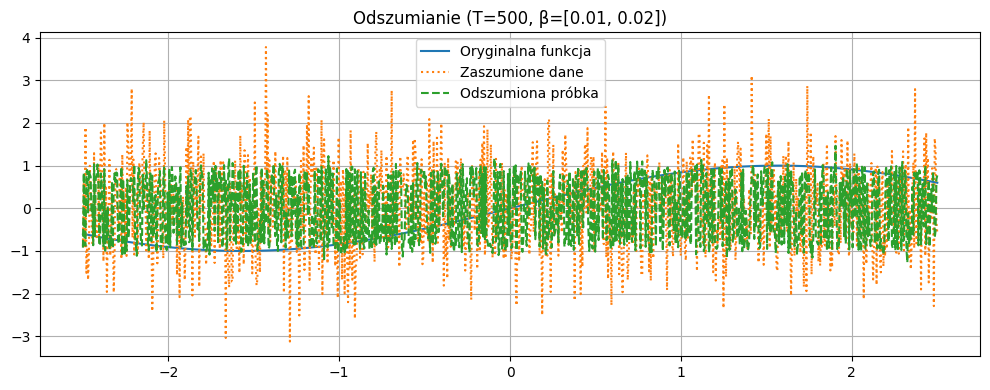

In [71]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Funkcja zaszumiająca
def q_sample(x0, t, alpha_bars, noise):
    sqrt_alpha_bar = torch.sqrt(alpha_bars[t]).view(-1, 1)
    sqrt_one_minus = torch.sqrt(1 - alpha_bars[t]).view(-1, 1)
    return sqrt_alpha_bar * x0 + sqrt_one_minus * noise


# Dyfuzyjny MLP z dynamicznym T
def sinusoidal_embedding(timesteps, dim):
    device = timesteps.device
    half_dim = dim // 2
    emb = torch.exp(torch.arange(half_dim, device=device) * -np.log(10000.0) / (half_dim - 1))
    emb = timesteps.float().unsqueeze(1) * emb.unsqueeze(0)
    return torch.cat((torch.sin(emb), torch.cos(emb)), dim=1)


class DiffusionMLP(nn.Module):
    def __init__(self, T=None, hidden=[128, 128]):
        super().__init__()
        self.time_dim = 32  # sinusoidal embedding size
        self.net = nn.Sequential(
            nn.Linear(1 + self.time_dim, hidden[0]),
            nn.ReLU(),
            nn.Linear(hidden[0], hidden[1]),
            nn.ReLU(),
            nn.Linear(hidden[1], 1)
        )

    def forward(self, x, t):
        t_embed = sinusoidal_embedding(t, self.time_dim)
        x_input = torch.cat([x, t_embed], dim=1)
        return self.net(x_input)



# Funkcja treningowa
def train_diffusion_model(x0_np, T, beta_start, beta_end, epochs=20000):
    x0 = torch.tensor(x0_np, dtype=torch.float32).unsqueeze(1).to(device)

    betas = torch.linspace(beta_start, beta_end, T, device=device)
    alphas = 1. - betas
    alpha_bars = torch.cumprod(alphas, dim=0)

    model = DiffusionMLP(T=T).to(device)
    #model = torch.compile(model)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()
    losses = []

    dataset = TensorDataset(x0)
    loader = DataLoader(dataset, batch_size=512, shuffle=True)
    for epoch in range(epochs):
        for xb, in loader:
            t = torch.randint(0, T, (xb.shape[0],), device=device)
            noise = torch.randn_like(xb)
            xt = q_sample(xb, t, alpha_bars, noise)
            pred_noise = model(xt, t)
            loss = loss_fn(pred_noise, noise)
            losses.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
    
        # Test predykcji szumu
    with torch.no_grad():
        test_x = torch.tensor(x0_np, dtype=torch.float32).unsqueeze(1).to(device)
        t_test = torch.randint(0, T, (test_x.shape[0],), device=device)
        noise = torch.randn_like(test_x)
        xt = q_sample(test_x, t_test, alpha_bars, noise)
        pred = model(xt, t_test)
        test_mse = ((pred - noise)**2).mean().item()
        print(f"Test MSE noise prediction: {test_mse:.6f}")

    
    return model, alpha_bars, betas, losses


# Sampling
@torch.no_grad()
def sample_from_model(model, T, alpha_bars, betas, alphas):
    x = torch.randn(1000, 1).to(device)

    for t in reversed(range(T)):
        t_tensor = torch.full((x.shape[0],), t, dtype=torch.long, device=device)
        beta_t = betas[t].clone().detach()
        alpha_t = alphas[t].clone().detach()
        alpha_bar_t = alpha_bars[t].clone().detach()

        sqrt_recip_alpha = 1. / torch.sqrt(alpha_t)
        sqrt_inv_one_minus = beta_t / torch.sqrt(1 - alpha_bar_t)

        eps_theta = model(x, t_tensor)
        z = torch.randn_like(x) if t > 0 else torch.zeros_like(x)
        sigma_t = torch.sqrt(beta_t)
        x = sqrt_recip_alpha * (x - sqrt_inv_one_minus * eps_theta) + sigma_t * z

    return x


# === Eksperymenty ===
x_vals = np.linspace(-2.5, 2.5, 1000)
y_vals = np.sin(x_vals)

# Testowane konfiguracje
configs = [
    {"T": 50, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 200, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 700, "beta_start": 0.0001, "beta_end": 0.0002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.002},
    {"T": 100, "beta_start": 0.0001, "beta_end": 0.02},
    {"T": 100, "beta_start": 0.001, "beta_end": 0.002},
    {"T": 100, "beta_start": 0.01, "beta_end": 0.02},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.002},
    {"T": 500, "beta_start": 0.0001, "beta_end": 0.02},
    {"T": 500, "beta_start": 0.001, "beta_end": 0.002},
    {"T": 500, "beta_start": 0.01, "beta_end": 0.02},
]

for config in configs:
    print(f"Trenuję model z T={config['T']}, beta_start={config['beta_start']}, beta_end={config['beta_end']}")

    model, alpha_bars, betas, losses = train_diffusion_model(
        y_vals,
        T=config["T"],
        beta_start=config["beta_start"],
        beta_end=config["beta_end"],
        epochs=2000
    )

    alphas = 1 - betas
    samples = sample_from_model(model, config["T"], alpha_bars, betas, alphas).cpu().squeeze().numpy()
    t_test = torch.tensor([config["T"] - 1] * len(y_vals), device=device)
    x0_tensor = torch.tensor(y_vals, dtype=torch.float32).unsqueeze(1).to(device)
    noise = torch.randn_like(x0_tensor)
    xt = q_sample(x0_tensor, t_test, alpha_bars, noise).detach().cpu().numpy().squeeze()


    # Wykres loss
    plt.figure(figsize=(8, 3))
    plt.plot(losses)
    plt.title(f"Loss (T={config['T']}, β=[{config['beta_start']}, {config['beta_end']}])")
    plt.xlabel("Epoka")
    plt.ylabel("MSE")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Wykres generowanych danych
    plt.figure(figsize=(10, 4))
    plt.plot(x_vals, y_vals, label="Oryginalna funkcja")
    plt.plot(x_vals, xt, label="Zaszumione dane", linestyle=":")
    plt.plot(x_vals, samples, label="Odszumiona próbka", linestyle="--")
    plt.title(f"Odszumianie (T={config['T']}, β=[{config['beta_start']}, {config['beta_end']}])")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    


Symulacja reverse bez realnej wiedzy modelu (testowanie parametrów), czysto symulacyjny przykład działania DDPM bez trenowania modelu, z ręcznie zasymulowaną predykcją szumu:



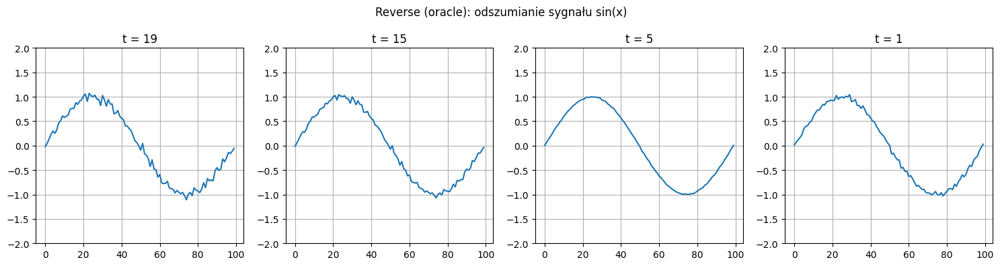

MSE między x0 a x_recon: 0.000908


In [82]:
import numpy as np
import matplotlib.pyplot as plt

# Parametry
T = 20
x0 = np.sin(np.linspace(0, 2 * np.pi, 100))  # czysty sygnał

# Forward proces
beta_start = 0.0001
beta_end = 0.0002
betas = np.linspace(beta_start, beta_end, T)
alphas = 1 - betas
alpha_bars = np.cumprod(alphas)

# Funkcja dodająca szum
def q_sample(x0, t, noise=None):
    if noise is None:
        noise = np.random.normal(size=x0.shape)
    sqrt_alpha_bar = np.sqrt(alpha_bars[t])
    sqrt_one_minus_alpha_bar = np.sqrt(1 - alpha_bars[t])
    return sqrt_alpha_bar * x0 + sqrt_one_minus_alpha_bar * noise

t0 = T - 1
true_noise = np.random.normal(size=x0.shape)
x_t = q_sample(x0, t0, true_noise)

# Placeholder dla modelu
def epsilon_theta(x_t, t):
    return true_noise

# Funkcja reverse (1 krok)
def reverse_step(x_t, t, stochastic=True):
    beta_t = betas[t]
    alpha_t = alphas[t]
    alpha_bar_t = alpha_bars[t]

    eps_theta = epsilon_theta(x_t, t)
    mean = (1 / np.sqrt(alpha_t)) * (x_t - (beta_t / np.sqrt(1 - alpha_bar_t)) * eps_theta)

    if stochastic:
        sigma_t = np.sqrt(beta_t)
        z = np.random.normal(size=x_t.shape) if t > 1 else np.zeros_like(x_t)
        x_prev = mean + sigma_t * z
    else:
        x_prev = mean 

    return x_prev

samples = [(t0, x_t.copy())]

for t in reversed(range(1, T)):
    x_t = reverse_step(x_t, t, stochastic=False)
    if t in [15, 5, 1]:
        samples.append((t, x_t.copy()))

# Wykres: odszumianie w czasie
plt.figure(figsize=(15, 4))
for i, (t_val, sample) in enumerate(samples):
    plt.subplot(1, len(samples), i + 1)
    plt.plot(sample)
    plt.title(f't = {t_val}')
    plt.ylim(-2, 2)
    plt.grid()
plt.suptitle("Reverse (oracle): odszumianie sygnału sin(x)")
plt.tight_layout()
plt.show()

# Porównanie końcowego odszumionego z oryginalnym
x_recon = x_t
mse = np.mean((x0 - x_recon)**2)
print(f"MSE między x0 a x_recon: {mse:.6f}")


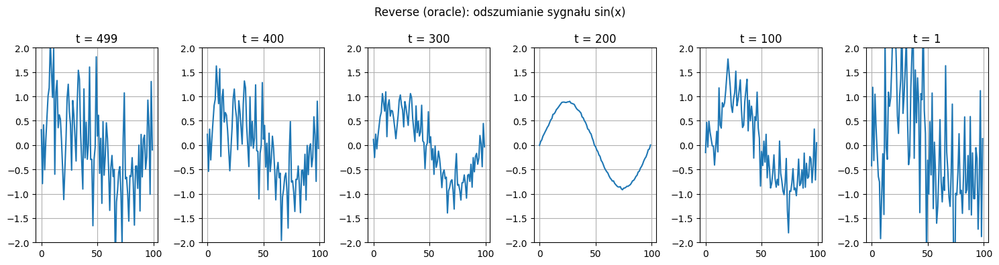

MSE między x0 a x_recon: 1.066253


In [84]:
import numpy as np
import matplotlib.pyplot as plt

# Parametry
T = 500  # liczba kroków dyfuzji
x0 = np.sin(np.linspace(0, 2 * np.pi, 100))  # czysty sygnał

# Forward process: parametry beta, alpha, alpha_bar
beta_start = 0.001
beta_end = 0.002
betas = np.linspace(beta_start, beta_end, T)
alphas = 1 - betas
alpha_bars = np.cumprod(alphas)

# Forward step – dodawanie szumu
def q_sample(x0, t, noise=None):
    if noise is None:
        noise = np.random.normal(size=x0.shape)
    sqrt_alpha_bar = np.sqrt(alpha_bars[t])
    sqrt_one_minus_alpha_bar = np.sqrt(1 - alpha_bars[t])
    return sqrt_alpha_bar * x0 + sqrt_one_minus_alpha_bar * noise

# Zaczynamy od mocno zaszumionego x_T (na końcu procesu)
t0 = T - 1
true_noise = np.random.normal(size=x0.shape)
x_t = q_sample(x0, t0, true_noise)

# Oracle: funkcja zwracająca dokładny szum (z forwarda)
def epsilon_theta(x_t, t):
    return true_noise  # idealna znajomość szumu

# Reverse step (z opcjonalną losowością)
def reverse_step(x_t, t, stochastic=True):
    beta_t = betas[t]
    alpha_t = alphas[t]
    alpha_bar_t = alpha_bars[t]

    eps_theta = epsilon_theta(x_t, t)
    mean = (1 / np.sqrt(alpha_t)) * (x_t - (beta_t / np.sqrt(1 - alpha_bar_t)) * eps_theta)

    if stochastic:
        sigma_t = np.sqrt(beta_t)
        z = np.random.normal(size=x_t.shape) if t > 1 else np.zeros_like(x_t)
        x_prev = mean + sigma_t * z
    else:
        x_prev = mean

    return x_prev

# Reverse proces: od t=T-1 do t=1
samples = [(t0, x_t.copy())]

for t in reversed(range(1, T)):
    x_t = reverse_step(x_t, t, stochastic=False)  # deterministycznie
    if t in [400, 300, 200, 100, 1]:
        samples.append((t, x_t.copy()))

# Wykres: odszumianie w czasie
plt.figure(figsize=(15, 4))
for i, (t_val, sample) in enumerate(samples):
    plt.subplot(1, len(samples), i + 1)
    plt.plot(sample)
    plt.title(f't = {t_val}')
    plt.ylim(-2, 2)
    plt.grid()
plt.suptitle("Reverse (oracle): odszumianie sygnału sin(x)")
plt.tight_layout()
plt.show()

# Porównanie końcowego odszumionego z oryginalnym
x_recon = x_t
mse = np.mean((x0 - x_recon)**2)
print(f"MSE między x0 a x_recon: {mse:.6f}")


In [85]:

# === Generowanie funkcji ===
def generate_function(name):
    eps = 1e-6
    if name == 'sin':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.sin(x)
    elif name == 'tan':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.tan(x)
    elif name == 'sgn':
        x= np.linspace(-2, 2, 100)
        return np.sign(x),
    elif name == 'sigmoid':
        x = np.linspace(-2, 2, 100)
        return 1 / (1 + np.exp(-x))
    elif name == 'relu':
        x = np.linspace(-2, 2, 100)
        return np.maximum(0, x)
    elif name == 'log10':
        x=np.linspace(-2, 2, 100)
        return np.log10(np.abs(x) + eps)
    elif name == 'log2':
        x=np.linspace(-2, 2, 100)
        return np.log2(np.abs(x) + eps)
    elif name == 'inv':
        x= np.linspace(-2, 2, 100)
        return 1 / (x + eps)
    elif name == 'exp':
        x= np.linspace(-2, 2, 100)
        return np.exp(x)
    elif name == 'linear':
        x = np.linspace(-2, 2, 100)
        return x
    elif name == 'square':
        x= np.linspace(-2, 2, 100)
        return x**2
    elif name == 'cube':
        x = np.linspace(-2, 2, 100)
        return x**3
    elif name == 'lin_comb':
        x = np.linspace(-2, 2, 100)
        return 0.5 * x + 0.5 * x**2
    elif name == 'sin1/x':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.sin(1 / (x + eps))
    elif name == 'sin2':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.sin(2 * x)
    elif name == 'sinc':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.sinc(x / np.pi)
    elif name == 'gaussian':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.exp(-x**2)
    elif name == 'modulated':
        x=np.linspace(-2 * math.pi, 2 * math.pi, 100)
        return np.sin(x) * np.exp(-x**2)
    else:
        raise ValueError(f"Nieznana funkcja: {name}")



Kod poniżej:
* Przetwarza cały sygnał jako całość – przewiduje szum dla całej krzywej jednocześnie.

* Jest bliżej DDPM w przestrzeni obrazów, gdzie dane mają wiele wymiarów.

* Sampling działa bez losowości (σ = 0) → przypomina DDIM.

Używane urządzenie: cuda
Epoch 100, Loss: 0.876283
Epoch 200, Loss: 0.698810
Epoch 300, Loss: 0.588269
Epoch 400, Loss: 0.523954
Epoch 500, Loss: 0.476493
Epoch 600, Loss: 0.436955
Epoch 700, Loss: 0.398957
Epoch 800, Loss: 0.364629
Epoch 900, Loss: 0.339176
Epoch 1000, Loss: 0.315824
Epoch 1100, Loss: 0.297143
Epoch 1200, Loss: 0.278718
Epoch 1300, Loss: 0.260387
Epoch 1400, Loss: 0.249160
Epoch 1500, Loss: 0.246708
Epoch 1600, Loss: 0.228658
Epoch 1700, Loss: 0.220182
Epoch 1800, Loss: 0.216666
Epoch 1900, Loss: 0.214474
Epoch 2000, Loss: 0.214504

Czas treningu: 5.67 s (cuda)


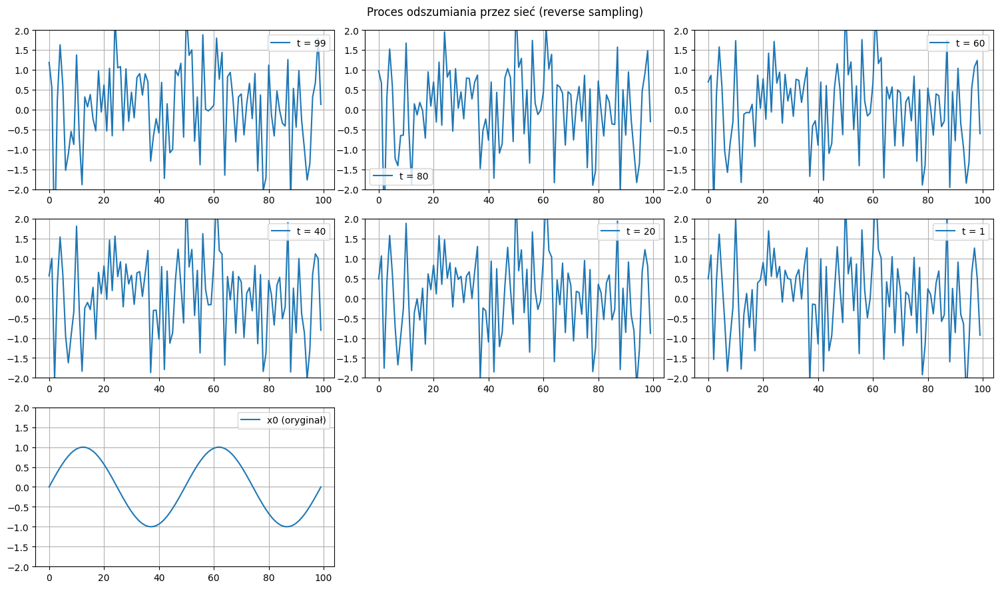

MSE końcowe (t=1 vs x0): 1.419533


In [92]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import time
import math

# Ustawienie urządzenia
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Używane urządzenie: {device}")

# Funkcja sinusa jako x₀ (złożona: 2 okresy)
def generate_function(name):
    if name == 'sin':
        return np.sin(np.linspace(0, 4 * np.pi, 100))
    raise NotImplementedError("Tylko 'sin' jest zaimplementowane.")

# Parametry dyfuzji
T = 100
beta_start = 0.0001
beta_end = 0.0002
betas = torch.linspace(beta_start, beta_end, T).to(device)
alphas = 1 - betas
alpha_bars = torch.cumprod(alphas, dim=0)

# Sygnał wejściowy
x0_np = generate_function('sin')
x0 = torch.tensor(x0_np, dtype=torch.float32).to(device)

# Model MLP do przewidywania ε
class EpsilonModel(nn.Module):
    def __init__(self, signal_size=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(signal_size + 1, 128),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, signal_size)
        )

    def forward(self, x_t, t):
        t = t.float().view(-1, 1) / T
        x = torch.cat([x_t, t], dim=1)
        return self.net(x)

# Inicjalizacja modelu
model = EpsilonModel(signal_size=100).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Dane treningowe
epochs = 2000
batch_size = 128
x0_batch = x0.repeat(batch_size, 1)
times = torch.randint(1, T, (batch_size,), device=device)
noise = torch.randn_like(x0_batch)
sqrt_ab = torch.sqrt(alpha_bars[times]).unsqueeze(1)
sqrt_1mab = torch.sqrt(1 - alpha_bars[times]).unsqueeze(1)
x_t_batch = sqrt_ab * x0_batch + sqrt_1mab * noise

# Trening modelu
start = time.time()
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    pred_noise = model(x_t_batch, times)
    loss = F.mse_loss(pred_noise, noise)
    loss.backward()
    optimizer.step()
    if (epoch + 1) % 100 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.item():.6f}")
end = time.time()
print(f"\nCzas treningu: {end - start:.2f} s ({device})")

# Reverse sampling (na batchu)
model.eval()
with torch.no_grad():
    xt = torch.randn((16, 100)).to(device)  # większy batch
    steps = [(T - 1, xt[0].cpu().numpy())]  # zapisz tylko 1. próbkę

    for t in reversed(range(1, T)):
        beta_t = betas[t]
        alpha_t = alphas[t]
        alpha_bar_t = alpha_bars[t]

        t_tensor = torch.full((xt.shape[0], 1), t / T, device=device)
        eps = model(xt, t_tensor)

        mean = (1 / torch.sqrt(alpha_t)) * (
            xt - (beta_t / torch.sqrt(1 - alpha_bar_t)) * eps
        )
        sigma_t = torch.sqrt(beta_t)
        z = torch.randn_like(xt) if t > 1 else torch.zeros_like(xt)
        xt = mean + sigma_t * z

        if t % 20 == 0 or t == 1:
            steps.append((t, xt[0].cpu().numpy()))  # zapisz tylko jedną próbkę

# Dodaj oryginalny sygnał
steps.append(("x0", x0.cpu().numpy()))

# Wizualizacja
n_plots = len(steps)
cols = 3
rows = math.ceil(n_plots / cols)

plt.figure(figsize=(5 * cols, 3 * rows))
for i, (t_val, signal) in enumerate(steps):
    plt.subplot(rows, cols, i + 1)
    plt.plot(signal, label=f"t = {t_val}" if t_val != "x0" else "x0 (oryginał)")
    plt.ylim(-2, 2)
    plt.grid(True)
    plt.legend()
plt.suptitle("Proces odszumiania przez sieć (reverse sampling)")
plt.tight_layout()
plt.show()

# Oblicz MSE względem x0
final_sample = steps[-2][1]
mse = np.mean((final_sample - x0_np) ** 2)
print(f"MSE końcowe (t=1 vs x0): {mse:.6f}")


Kod poniżej:
* Jest bardziej samowystarczalny (nie wymaga generate_function),

* Szybciej się wykonuje dzięki mniejszej liczbie epok
* nie zawiera probabilistycznego składnika σ_t * z w sampling - to jest DDIM-like, deterministyczny sampling.




In [94]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import time

device = torch.device("cpu")
print(f"Używane urządzenie: {device}")

# Parametry procesu dyfuzji
T = 100
beta_start = 0.0001
beta_end = 0.0002
betas = torch.linspace(beta_start, beta_end, T).to(device)
alphas = 1 - betas
alpha_bars = torch.cumprod(alphas, dim=0)

# Przykładowe dane (sinusoida)
x_vals = np.linspace(0, 2 * np.pi, 100)
x0_np = np.sin(x_vals)
x0 = torch.tensor(x0_np, dtype=torch.float32).to(device)

# Funkcja do zaszumiania x0 w kroku t
def q_sample(x0, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x0)
    sqrt_alpha_bar = torch.sqrt(alpha_bars[t]).view(-1, 1)
    sqrt_one_minus_alpha_bar = torch.sqrt(1 - alpha_bars[t]).view(-1, 1)
    return sqrt_alpha_bar * x0 + sqrt_one_minus_alpha_bar * noise

# Prosty model predykcji szumu – sieć neuronowa
class EpsilonModel(nn.Module):
    def __init__(self, signal_size=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(signal_size + 1, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, signal_size)
        )

    def forward(self, x_t, t):
        # t to indeksy czasu, zamieniamy na wektor i dołączamy do danych
        t = t.float().view(-1, 1) / T
        x = torch.cat([x_t, t], dim=1)
        return self.net(x)

# Inicjalizacja modelu i optymalizatora
model = EpsilonModel(signal_size=100).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Trening modelu
epochs = 1000
batch_size = 64

# Przygotuj zestaw danych
x0_batch = x0.repeat(batch_size, 1)
times = torch.randint(1, T, (batch_size,)).to(device)
noise = torch.randn_like(x0_batch)
x_t_batch = torch.sqrt(alpha_bars[times]).unsqueeze(1) * x0_batch + \
            torch.sqrt(1 - alpha_bars[times]).unsqueeze(1) * noise

# Funkcja treningowa
start = time.time()
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    
    # Przewidywanie szumu
    pred_noise = model(x_t_batch, times)
    
    # Simple loss: MSE pomiędzy rzeczywistym a przewidywanym szumem
    loss = F.mse_loss(pred_noise, noise)
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 100 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.item():.6f}")
end = time.time()
print(f"\nCzas treningu: {end - start:.2f} s ({device})")

# Test: denoising od x_T
model.eval()
with torch.no_grad():
    xt = torch.randn((1, 100)).to(device)
    steps = [xt.squeeze().cpu().numpy()]
    for t in reversed(range(1, T, T // 5)):
        beta_t = betas[t]
        alpha_t = alphas[t]
        alpha_bar_t = alpha_bars[t]
        eps = model(xt, torch.tensor([t], device=device))

        mean = (1 / torch.sqrt(alpha_t)) * (
            xt - beta_t / torch.sqrt(1 - alpha_bar_t) * eps
        )
        xt = mean  # bez szumu z (sigma_t * z) dla uproszczenia
        steps.append(xt.squeeze().cpu().numpy())


Używane urządzenie: cpu
Epoch 100, Loss: 0.755107
Epoch 200, Loss: 0.544882
Epoch 300, Loss: 0.433813
Epoch 400, Loss: 0.353885
Epoch 500, Loss: 0.282211
Epoch 600, Loss: 0.225053
Epoch 700, Loss: 0.180303
Epoch 800, Loss: 0.147125
Epoch 900, Loss: 0.122918
Epoch 1000, Loss: 0.104119

Czas treningu: 2.64 s (cpu)
